In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data Prep

In [ ]:
import numpy as np, pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# ------------------------------------------------------------
# 0 · Ler ficheiro
# ------------------------------------------------------------
FILE = "classified!"
data = pd.read_excel(FILE)

# ------------------------------------------------------------
# 1 · Remover colunas inúteis /  NaN
# ------------------------------------------------------------
DROP_NULL = ['Sentido (c/ separador central)', 'Km / N.º Polícia']
DROP_MISC = ['PAV', 'NPAV', 'Acidente denunciado', 'Designação da via','Freguesia', 'Comando', 'Destacamento', 'Posto','Coordenadas Latitude', 'Coordenadas Longitude']

data = (data
        .drop(DROP_NULL, axis=1)
        .dropna(axis=0)
        .reset_index(drop=True)
        .drop(DROP_MISC, axis=1))

# ------------------------------------------------------------
# 2 · Datas  →  manter “Data” + criar Ano / Mês
# ------------------------------------------------------------
data['Data']      = pd.to_datetime(data['Data'])
data['Data_Ano']  = data['Data'].dt.year.astype('uint16')
data['Data_Mes']  = data['Data'].dt.month.astype('uint8')
data = data.drop('Hora da Ocorrência', axis=1)

# ------------------------------------------------------------
# 3 · Binarizar Feriado · Localização · Tipo acidente
# ------------------------------------------------------------
def _norm(s):
    return s.astype(str).str.lower().str.strip()

data['Feriado'] = _norm(data['Feriado']).eq('sim').astype('uint8')

loc_map = {'dentro de localidade': 0,
           'fora de localidade'  : 1}
data['Localização'] = (_norm(data['Localização'])
                       .map(loc_map)
                       .fillna(0)
                       .astype('uint8'))

# Tipo de acidente (0 = danos materiais ; 1 = com vítimas)
tipo_norm = _norm(data['Tipo de acidente'])
data['TipoAcid'] = np.where(
        tipo_norm.str.contains('com vítimas', regex=False), 1, 0).astype('uint8')
data = data.drop('Tipo de acidente', axis=1)
data = data.drop('Fuga', axis=1)

# ------------------------------------------------------------
# 4 · Severidade (0 danos / 1 leves / 2 graves / 3 mortos)
# ------------------------------------------------------------
def assign_severity(r):
    if r['TipoAcid'] == 0:
        return 0
    if r['Mortos'] > 0:      return 3
    if r['F. Graves'] > 0:   return 2
    return 1

data['Severity'] = data.apply(assign_severity, axis=1).astype('uint8')

# ------------------------------------------------------------
# 5 · One-hot das variáveis categóricas
# ------------------------------------------------------------
CATS  = ['Natureza do acidente', 'Subnatureza do acidente',
         'Fatores atmosféricos', 'Condições Luminosidade',
         'Distrito', 'Concelho', 'Tipo de via', 'Causa Provável']
PREFS = ['NA','SA','FA','CL','DT','CH','TV','CP']

data = pd.get_dummies(data, columns=CATS, prefix=PREFS, dtype='uint8')

# ------------------------------------------------------------
# 6 · X, y  (Data excluída do treino)
# ------------------------------------------------------------
y = data['Severity'].copy()
X = (data
     .drop(['Severity', 'Mortos', 'F. Graves', 'F. Leves','Data'], axis=1)
     .astype(np.float64))

print("Shape final -> X:", X.shape, " | y:", y.shape)

# ------------------------------------------------------------
# 7 · Train-test split  +  scaling
# ------------------------------------------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, train_size=0.80, random_state=100, stratify=y)

scaler  = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)

# ------------------------------------------------------------
# 8 · Verificação dos novos binários
# ------------------------------------------------------------
for col in ['Feriado', 'Localização', 'TipoAcid']:
    ones  = int(data[col].sum())
    total = len(data)
    print(f"{col:<14}: {ones} (1s) | {total-ones} (0s)")


Shape final -> X: (311366, 369)  | y: (311366,)
Feriado       : 8627 (1s) | 302739 (0s)
Localização   : 84687 (1s) | 226679 (0s)
TipoAcid      : 82331 (1s) | 229035 (0s)


In [ ]:
data

,Data,Feriado,Mortos,F. Graves,F. Leves,Localização,Data_Ano,Data_Mes,TipoAcid,Severity,...,CP_Fadiga,CP_Falha mecânica do veículo,CP_Falta de destreza,CP_Manobra irregular,CP_Não identificada,CP_Não sinalização da manobra,CP_Obstáculo imprevisto na faixa de rodagem,CP_Queda de carga ou objeto,CP_Rebentamento pneumático,CP_Velocidade excessiva para as condições existentes
0,2019-12-30,0,0,0,0,0,2019,12,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2019-12-28,0,0,0,0,0,2019,12,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2019-12-27,0,0,0,0,0,2019,12,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2019-12-11,0,0,0,0,0,2019,12,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2019-12-07,0,0,0,0,0,2019,12,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,2023-05-03,0,0,0,0,0,2023,5,0,0,...,0,0,0,0,0,0,0,0,0,0
311362,2023-05-02,0,0,0,0,0,2023,5,0,0,...,0,0,0,0,0,0,0,0,0,0
311363,2023-05-02,0,0,0,0,0,2023,5,0,0,...,0,0,0,0,0,0,0,0,0,0
311364,2023-05-01,0,0,0,0,0,2023,5,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
(data.sample(n=10))

,Data,Feriado,Mortos,F. Graves,F. Leves,Localização,Data_Ano,Data_Mes,TipoAcid,Severity,...,CP_Fadiga,CP_Falha mecânica do veículo,CP_Falta de destreza,CP_Manobra irregular,CP_Não identificada,CP_Não sinalização da manobra,CP_Obstáculo imprevisto na faixa de rodagem,CP_Queda de carga ou objeto,CP_Rebentamento pneumático,CP_Velocidade excessiva para as condições existentes
183105,2019-08-11,0,0,0,0,1,2019,8,0,0,...,0,0,0,1,0,0,0,0,0,0
189539,2021-01-05,0,0,0,0,1,2021,1,0,0,...,0,0,0,0,0,0,1,0,0,0
70090,2019-08-30,0,0,0,0,0,2019,8,0,0,...,0,0,1,0,0,0,0,0,0,0
11310,2022-06-15,0,0,0,0,0,2022,6,0,0,...,0,0,0,0,0,0,0,0,0,0
6915,2021-07-29,0,0,0,0,0,2021,7,0,0,...,0,0,0,0,0,0,0,0,0,0
66702,2021-06-26,0,0,0,0,0,2021,6,0,0,...,0,0,0,0,0,0,0,0,0,0
299621,2023-01-26,0,0,0,1,0,2023,1,1,1,...,0,1,0,0,0,0,0,0,0,0
182802,2022-01-19,0,0,0,0,0,2022,1,0,0,...,0,0,0,0,0,0,0,0,0,0
129510,2022-10-10,0,0,0,2,0,2022,10,1,1,...,0,0,0,0,0,0,0,0,0,0
103328,2022-01-18,0,0,0,1,0,2022,1,1,1,...,0,0,0,0,0,0,0,0,0,0


Grupos encontrados: ['NA', 'SA', 'FA', 'CL', 'DT', 'CH', 'TV', 'CP']


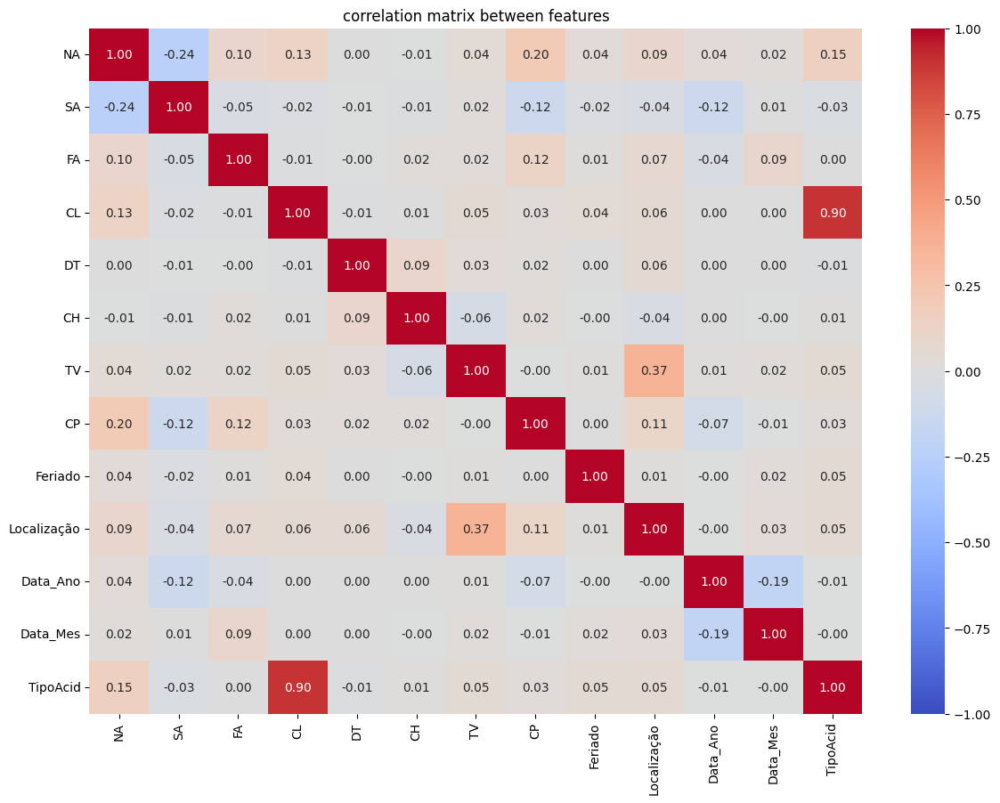

['Natureza do acidente', 'Subnatureza do acidente','Fatores atmosféricos','Condições Luminosidade','Distrito', 'Concelho', 'Tipo de via', 'Causa Provável']


In [ ]:
import re, numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

# ------------------------------------------------------------------
# 0 · seleccionar apenas as features que entram no treino
# ------------------------------------------------------------------
FEATS = [c for c in data.columns
         if c not in ['Severity',                         # alvo
                      'Mortos', 'F. Graves', 'F. Leves',   # dependências directas
                      'Data',                              # timestamp bruto
                      ]]

X_df = data[FEATS].copy()          # DataFrame usado só para o heat-map

# ------------------------------------------------------------------
# 1 · detectar grupos pelos prefixos (antes do primeiro '_')
# ------------------------------------------------------------------
pattern = re.compile(r'^([A-Z]{2})_')      # ex.: "CP_Algo" → "CP"
groups  = {}
for col in X_df.columns:
    m = pattern.match(col)
    if m:
        pref = m.group(1)
        groups.setdefault(pref, []).append(col)

print("Grupos encontrados:", list(groups.keys()))

# ------------------------------------------------------------------
# 2 · reconstruir cada coluna categórica como int (0,1,2,…)
# ------------------------------------------------------------------
collapsed = pd.DataFrame(index=X_df.index)

for pref, cols in groups.items():
    # para cada linha, devolve a posição (0..k-1) da dummy que está a 1
    collapsed[pref] = X_df[cols].idxmax(axis=1) \
                                   .apply(lambda s: cols.index(s))

# acrescentar variáveis numéricas “puras” (já estavam em X_df)
num_cols = [c for c in X_df.columns
            if c not in sum(groups.values(), [])]     # não são dummies
collapsed = pd.concat([collapsed, X_df[num_cols]], axis=1)

# ------------------------------------------------------------------
# 3 · correlação e heat-map
# ------------------------------------------------------------------
corr = collapsed.corr(numeric_only=True)     # Pearson
plt.figure(figsize=(14,10))
sns.heatmap(corr, annot=True, fmt='.2f', vmin=-1, vmax=1, cmap='coolwarm')
plt.title('Correlation matrix between features')
plt.show()
print("['Natureza do acidente', 'Subnatureza do acidente','Fatores atmosféricos','Condições Luminosidade','Distrito', 'Concelho', 'Tipo de via', 'Causa Provável']")
print(['Accident Nature', 'Accident Subnature', 'Atmospheric Factors', 'Lighting Conditions', 'District', 'Municipality', 'Road Type', 'Probable Cause'])


Grupos encontrados: ['NA', 'SA', 'FA', 'CL', 'DT', 'CH', 'TV', 'CP']


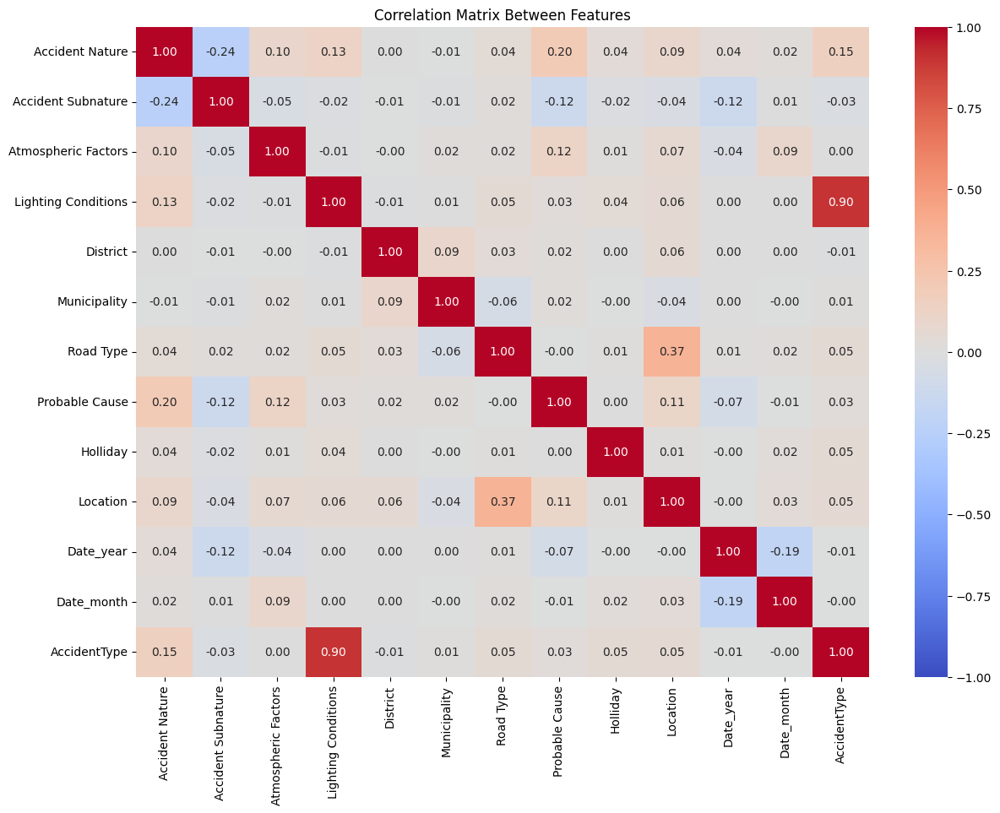

In [ ]:
import re, numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

# ------------------------------------------------------------------
# 0 · Selecionar apenas as features que entram no treino
# ------------------------------------------------------------------
FEATS = [c for c in data.columns
         if c not in ['Severity',                         # alvo
                      'Mortos', 'F. Graves', 'F. Leves',   # dependências diretas
                      'Data',                              # timestamp bruto
                      ]]

X_df = data[FEATS].copy()          # DataFrame usado só para o heat-map

# ------------------------------------------------------------------
# 1 · Detectar grupos pelos prefixos (antes do primeiro '_')
# ------------------------------------------------------------------
pattern = re.compile(r'^([A-Z]{2})_')      # ex.: "CP_Algo" → "CP"
groups  = {}
for col in X_df.columns:
    m = pattern.match(col)
    if m:
        pref = m.group(1)
        groups.setdefault(pref, []).append(col)

print("Grupos encontrados:", list(groups.keys()))

# ------------------------------------------------------------------
# 2 · Reconstruir cada coluna categórica como int (0,1,2,…)
# ------------------------------------------------------------------
collapsed = pd.DataFrame(index=X_df.index)

for pref, cols in groups.items():
    # Para cada linha, devolve a posição (0..k-1) da dummy que está a 1
    collapsed[pref] = X_df[cols].idxmax(axis=1) \
                                   .apply(lambda s: cols.index(s))

# Acrescentar variáveis numéricas “puras” (já estavam em X_df)
num_cols = [c for c in X_df.columns
            if c not in sum(groups.values(), [])]     # não são dummies
collapsed = pd.concat([collapsed, X_df[num_cols]], axis=1)

# ------------------------------------------------------------------
# 3 · Tradução dos nomes (prefixos e variáveis individuais)
# ------------------------------------------------------------------
# Mapeando os prefixos portugueses para o inglês
prefix_translation = {
    'NA': 'Accident Nature',
    'SA': 'Accident Subnature',
    'FA': 'Atmospheric Factors',
    'CL': 'Lighting Conditions',
    'DT': 'District',
    'CH': 'Municipality',
    'TV': 'Road Type',
    'CP': 'Probable Cause'
}

# Tradução adicional das variáveis individuais
var_translation = {
    'Data_Ano': 'Date_year',
    'Data_Mes': 'Date_month',
    'Feriado': 'Holliday',
    'Localização': 'Location',
    'TipoAcid': 'AccidentType'
}

collapsed.rename(columns={**prefix_translation, **var_translation}, inplace=True)

# ------------------------------------------------------------------
# 4 · Correlação e heatmap
# ------------------------------------------------------------------
corr = collapsed.corr(numeric_only=True)     # Pearson
plt.figure(figsize=(14,10))
sns.heatmap(corr, annot=True, fmt='.2f', vmin=-1, vmax=1, cmap='coolwarm')
plt.title('Correlation Matrix Between Features')
plt.show()

weight MPL

## Stepbystep

In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

import tensorflow as tf

In [ ]:
file_path = r"/content/drive/MyDrive/Tese/Data_Sinistralidade_v2.xlsx"

data = pd.read_excel(file_path)

In [ ]:
data

NameError: name 'data' is not defined

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333213 entries, 0 to 333212
Data columns (total 29 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   PAV                             333213 non-null  object        
 1   NPAV                            333213 non-null  object        
 2   Data                            333213 non-null  datetime64[ns]
 3   Hora da Ocorrência              333213 non-null  object        
 4   Acidente denunciado             333213 non-null  object        
 5   Feriado                         333213 non-null  object        
 6   Mortos                          333213 non-null  int64         
 7   F. Graves                       333213 non-null  int64         
 8   F. Leves                        333213 non-null  int64         
 9   Natureza do acidente            333213 non-null  object        
 10  Subnatureza do acidente         329522 non-null  object 

### Valores em Falta

In [ ]:
data.isna().mean()

,0
PAV,0.000000
NPAV,0.000000
Data,0.000000
Hora da Ocorrência,0.000000
Acidente denunciado,0.000000
Feriado,0.000000
Mortos,0.000000
F. Graves,0.000000
F. Leves,0.000000
Natureza do acidente,0.000000


In [ ]:
null_columns = ['Sentido (c/ separador central)', 'Km / N.º Polícia']

data = data.drop(null_columns, axis=1)

In [ ]:
data.isna().sum()

,0
PAV,0
NPAV,0
Data,0
Hora da Ocorrência,0
Acidente denunciado,0
Feriado,0
Mortos,0
F. Graves,0
F. Leves,0
Natureza do acidente,0


In [ ]:
data = data.dropna(axis=0).reset_index(drop=True)

In [ ]:
print("Total missing values:", data.isna().sum().sum())

Total missing values: 0


In [ ]:
data

,PAV,NPAV,Data,Hora da Ocorrência,Acidente denunciado,Feriado,Mortos,F. Graves,F. Leves,Natureza do acidente,...,Distrito,Concelho,Freguesia,Localização,Tipo de via,Designação da via,Coordenadas Latitude,Coordenadas Longitude,Causa Provável,Fuga
0,G0004813/19.220130451,00704/2019 220130451,2019-12-30,19:00:00,Não,Não,0,0,0,Colisão,...,Porto,Felgueiras,União das freguesias de Margaride (Santa Eulál...,Dentro de localidade,Arruamento,Rua Dom Manuel Faria e Sousa,41.36206,-8.200085,Distração,Não
1,G0004337/19.220130453,00462/2019 220130453,2019-12-28,11:45:00,Não,Não,0,0,0,Colisão,...,Porto,Lousada,"União das freguesias de Cristelos, Boim e Ordem",Dentro de localidade,Arruamento,Rua de Santo André,41.26933,-8.287138,Distração,Não
2,G0006453/19.220130454,00469/2019 220130454,2019-12-27,19:50:00,Não,Não,0,0,0,Colisão,...,Porto,Paços de Ferreira,Meixomil,Dentro de localidade,Arruamento,Avenida de Sobrão,41.27308,-8.396473,Distração,Não
3,G0004611/19.220130451,00661/2019 220130451,2019-12-11,11:45:00,Não,Não,0,0,0,Colisão,...,Porto,Felgueiras,Idães,Dentro de localidade,Arruamento,Rua de Santa Maria,41.33372,-8.233006,Distração,Não
4,G0004131/19.220130453,00434/2019 220130453,2019-12-07,13:45:00,Não,Não,0,0,0,Colisão,...,Porto,Lousada,Vilar do Torno e Alentém,Dentro de localidade,Arruamento,Rua Dona Eduarda Lencastre,41.28444,-8.212481,Distração,Não
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,G0001863/23.220010352,00130/2023 220010352,2023-05-03,07:45:00,Não,Não,0,0,0,Colisão,...,Aveiro,Albergaria-a-Velha,Albergaria-a-Velha e Valmaior,Dentro de localidade,Arruamento,Rua Senhora Socorro,40.71761,-8.474364,Distração,Não
311362,G0001404/23.220030751,00111/2023 220030751,2023-05-02,19:10:00,Não,Não,0,0,0,Colisão,...,Braga,Amares,"União das freguesias de Ferreiros, Prozelo e B...",Dentro de localidade,Arruamento,Rua da Cintura,41.62585,-8.360073,Distração,Não
311363,G0000849/23.220070351,00017/2023 220070351,2023-05-02,11:00:00,Não,Não,0,0,0,Colisão,...,Évora,Arraiolos,Arraiolos,Dentro de localidade,Arruamento,Rotunda da Repsol - Arraiolos,38.72315,-7.982737,Distração,Não
311364,G0001297/23.220030455,00117/2023 220030455,2023-05-01,19:41:00,Não,Não,0,0,0,Colisão,...,Braga,Vila Verde,Lanhas,Dentro de localidade,Arruamento,Rua do Rio Homem,41.66651,-8.405170,Distração,Não


### Colunas desnecessárias

In [ ]:
{column: len(data[column].unique()) for column in data.columns if data.dtypes[column] == 'object'}

{'PAV': 311366,
 'NPAV': 311366,
 'Hora da Ocorrência': 1437,
 'Acidente denunciado': 2,
 'Feriado': 2,
 'Natureza do acidente': 3,
 'Subnatureza do acidente': 17,
 'Fatores atmosféricos': 7,
 'Condições Luminosidade': 6,
 'Tipo de acidente': 2,
 'Comando': 23,
 'Destacamento': 120,
 'Posto': 531,
 'Distrito': 19,
 'Concelho': 279,
 'Freguesia': 2702,
 'Localização': 2,
 'Tipo de via': 10,
 'Designação da via': 89501,
 'Causa Provável': 23,
 'Fuga': 2}

In [ ]:
unneeded_columns = ['PAV', 'NPAV', 'Acidente denunciado','Designação da via','Freguesia','Comando','Destacamento','Posto','Coordenadas Latitude','Coordenadas Longitude']

data = data.drop(unneeded_columns, axis=1)

In [ ]:
data

,Data,Hora da Ocorrência,Feriado,Mortos,F. Graves,F. Leves,Natureza do acidente,Subnatureza do acidente,Fatores atmosféricos,Condições Luminosidade,Tipo de acidente,Distrito,Concelho,Localização,Tipo de via,Causa Provável,Fuga
0,2019-12-30,19:00:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Felgueiras,Dentro de localidade,Arruamento,Distração,Não
1,2019-12-28,11:45:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Lousada,Dentro de localidade,Arruamento,Distração,Não
2,2019-12-27,19:50:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Paços de Ferreira,Dentro de localidade,Arruamento,Distração,Não
3,2019-12-11,11:45:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Felgueiras,Dentro de localidade,Arruamento,Distração,Não
4,2019-12-07,13:45:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Lousada,Dentro de localidade,Arruamento,Distração,Não
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,2023-05-03,07:45:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Aveiro,Albergaria-a-Velha,Dentro de localidade,Arruamento,Distração,Não
311362,2023-05-02,19:10:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Braga,Amares,Dentro de localidade,Arruamento,Distração,Não
311363,2023-05-02,11:00:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Évora,Arraiolos,Dentro de localidade,Arruamento,Distração,Não
311364,2023-05-01,19:41:00,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Braga,Vila Verde,Dentro de localidade,Arruamento,Distração,Não


In [ ]:
def get_years(df, column):
    return df[column].apply(lambda date: date[0:4]) #caracteres 0 e 4 da data para retornar os meses

def get_months(df, column):
    return df[column].apply(lambda date: date[5:7]) #caracteres 5 e 7 da data para retornar os meses

In [ ]:
if 'Data' in data.columns:
    data['Data_Ano'] = data['Data'].dt.year
    data['Data_Mes'] = data['Data'].dt.month
    data = data.drop(['Data', 'Hora da Ocorrência'], axis=1)
else:
    print("The 'Data' column does not exist in the DataFrame.")

In [ ]:
data

,Feriado,Mortos,F. Graves,F. Leves,Natureza do acidente,Subnatureza do acidente,Fatores atmosféricos,Condições Luminosidade,Tipo de acidente,Distrito,Concelho,Localização,Tipo de via,Causa Provável,Fuga,Data_Ano,Data_Mes
0,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Felgueiras,Dentro de localidade,Arruamento,Distração,Não,2019,12
1,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Lousada,Dentro de localidade,Arruamento,Distração,Não,2019,12
2,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Paços de Ferreira,Dentro de localidade,Arruamento,Distração,Não,2019,12
3,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Felgueiras,Dentro de localidade,Arruamento,Distração,Não,2019,12
4,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Porto,Lousada,Dentro de localidade,Arruamento,Distração,Não,2019,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Aveiro,Albergaria-a-Velha,Dentro de localidade,Arruamento,Distração,Não,2023,5
311362,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Braga,Amares,Dentro de localidade,Arruamento,Distração,Não,2023,5
311363,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Évora,Arraiolos,Dentro de localidade,Arruamento,Distração,Não,2023,5
311364,Não,0,0,0,Colisão,Lateral com outro veículo em movimento,Bom tempo,Indt.,Só com danos materiais,Braga,Vila Verde,Dentro de localidade,Arruamento,Distração,Não,2023,5


### Encoding

In [ ]:
def onehot_encode(df, columns, prefixes):
    df = df.copy()
    for column, prefix in zip(columns, prefixes):
        dummies = pd.get_dummies(df[column], prefix=prefix)
        df = pd.concat([df, dummies], axis=1)
        df = df.drop(column, axis=1)
    return df

In [ ]:
{column: len(data[column].unique()) for column in data.columns if data.dtypes[column] == 'object'}

{'Feriado': 2,
 'Natureza do acidente': 3,
 'Subnatureza do acidente': 17,
 'Fatores atmosféricos': 7,
 'Condições Luminosidade': 6,
 'Tipo de acidente': 2,
 'Distrito': 19,
 'Concelho': 279,
 'Localização': 2,
 'Tipo de via': 10,
 'Causa Provável': 23,
 'Fuga': 2}

In [ ]:
data = onehot_encode(
    data,
    columns=['Natureza do acidente', 'Subnatureza do acidente', 'Fatores atmosféricos', 'Condições Luminosidade','Distrito','Concelho','Tipo de via','Causa Provável'],
    prefixes=['NA','SA','FA','CL','DT','CH','TV','CP',]
)

In [ ]:
data

,Feriado,Mortos,F. Graves,F. Leves,Tipo de acidente,Localização,Fuga,Data_Ano,Data_Mes,NA_Atropelamento,...,CP_Fadiga,CP_Falha mecânica do veículo,CP_Falta de destreza,CP_Manobra irregular,CP_Não identificada,CP_Não sinalização da manobra,CP_Obstáculo imprevisto na faixa de rodagem,CP_Queda de carga ou objeto,CP_Rebentamento pneumático,CP_Velocidade excessiva para as condições existentes
0,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,False
1,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,False
2,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,False
3,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,False
4,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,False
311362,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,False
311363,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,False
311364,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
def assign_severity(row):
    if row['Tipo de acidente'] == 'Só com danos materiais':
        return 0
    elif row['Tipo de acidente'] == 'Com vítimas': # Corrected spelling
        if row['Mortos'] == 0 and row['F. Graves'] == 0 and row['F. Leves'] > 0:
            return 1
        elif row['Mortos'] == 0 and row['F. Graves'] > 0:
            return 2
        elif row['Mortos'] > 0:
            return 3
    return -1 # Default case for any other scenario

data['Severity'] = data.apply(assign_severity, axis=1)

display(data[['Mortos', 'F. Graves', 'F. Leves', 'Tipo de acidente', 'Severity']].head())

,Mortos,F. Graves,F. Leves,Tipo de acidente,Severity
0,0,0,0,Só com danos materiais,0
1,0,0,0,Só com danos materiais,0
2,0,0,0,Só com danos materiais,0
3,0,0,0,Só com danos materiais,0
4,0,0,0,Só com danos materiais,0


In [ ]:
data

,Feriado,Mortos,F. Graves,F. Leves,Tipo de acidente,Localização,Fuga,Data_Ano,Data_Mes,NA_Atropelamento,...,CP_Falha mecânica do veículo,CP_Falta de destreza,CP_Manobra irregular,CP_Não identificada,CP_Não sinalização da manobra,CP_Obstáculo imprevisto na faixa de rodagem,CP_Queda de carga ou objeto,CP_Rebentamento pneumático,CP_Velocidade excessiva para as condições existentes,Severity
0,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,0
1,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,0
2,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,0
3,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,0
4,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2019,12,False,...,False,False,False,False,False,False,False,False,False,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,0
311362,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,0
311363,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,0
311364,Não,0,0,0,Só com danos materiais,Dentro de localidade,Não,2023,5,False,...,False,False,False,False,False,False,False,False,False,0


In [ ]:
def get_binary_column(df, column):
    if column in ['Feriado', 'Fuga', 'Localização']:
        return df[column].map({'sim': 1}).fillna(0).astype('uint8')
    elif column == 'Tipo de acidente':
        return (df[column] != 'Só com danos materiais').astype('uint8')
    else:
        raise ValueError("Coluna não suportada")

In [ ]:
data['Feriado'] = get_binary_column(data, 'Feriado')
data['Fuga'] = get_binary_column(data, 'Fuga')
data['Localização'] = get_binary_column(data, 'Localização')

In [ ]:
for col in data.columns:
    if data[col].dtype == bool:
        data[col] = data[col].astype(int)

In [ ]:
# 1) converter todas as quatro colunas
data['Feriado']        = get_binary_column(data, 'Feriado')
data['Fuga']           = get_binary_column(data, 'Fuga')
data['Localização']    = get_binary_column(data, 'Localização')
data['TipoAcid_bin']   = get_binary_column(data, 'Tipo de acidente')

# 2) já não precisas da string original para o modelo
data = data.drop('Tipo de acidente', axis=1)

# 3) se ainda houver colunas booleanas, força-as para int8/uint8
for col in data.columns:
    if data[col].dtype == bool:
        data[col] = data[col].astype('uint8')


In [ ]:
data

,Feriado,Mortos,F. Graves,F. Leves,Localização,Fuga,Data_Ano,Data_Mes,NA_Atropelamento,NA_Colisão,...,CP_Falta de destreza,CP_Manobra irregular,CP_Não identificada,CP_Não sinalização da manobra,CP_Obstáculo imprevisto na faixa de rodagem,CP_Queda de carga ou objeto,CP_Rebentamento pneumático,CP_Velocidade excessiva para as condições existentes,Severity,TipoAcid_bin
0,0,0,0,0,0,0,2019,12,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,2019,12,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,2019,12,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,2019,12,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,2019,12,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311361,0,0,0,0,0,0,2023,5,0,1,...,0,0,0,0,0,0,0,0,0,0
311362,0,0,0,0,0,0,2023,5,0,1,...,0,0,0,0,0,0,0,0,0,0
311363,0,0,0,0,0,0,2023,5,0,1,...,0,0,0,0,0,0,0,0,0,0
311364,0,0,0,0,0,0,2023,5,0,1,...,0,0,0,0,0,0,0,0,0,0


### Splitting/Scaling

In [ ]:
y = data['Severity'].copy() #variável alvo
X = data.drop(['Severity', 'Mortos', 'F. Graves', 'F. Leves',], axis=1).copy() #tudo menos variável alvo e dependências

In [ ]:
y.unique()

array([0, 2, 3, 1])

In [ ]:
X = X.astype(np.float64)

In [ ]:
scaler = StandardScaler()

X = scaler.fit_transform(X)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=100)

In [ ]:
X.shape

(311366, 369)

In [ ]:
X_test.shape

(62274, 369)

In [ ]:
X_train.shape

(249092, 369)

In [ ]:
print("Distribuição de classes nos dados de treino:")
print(y_train.value_counts())

Distribuição de classes nos dados de treino:
Severity
0    183110
1     59875
2      4900
3      1207
Name: count, dtype: int64


## Distribuição De Classes

In [ ]:
print(data['Severity'].value_counts())

Severity
0    229035
1     74688
2      6124
3      1519
Name: count, dtype: int64


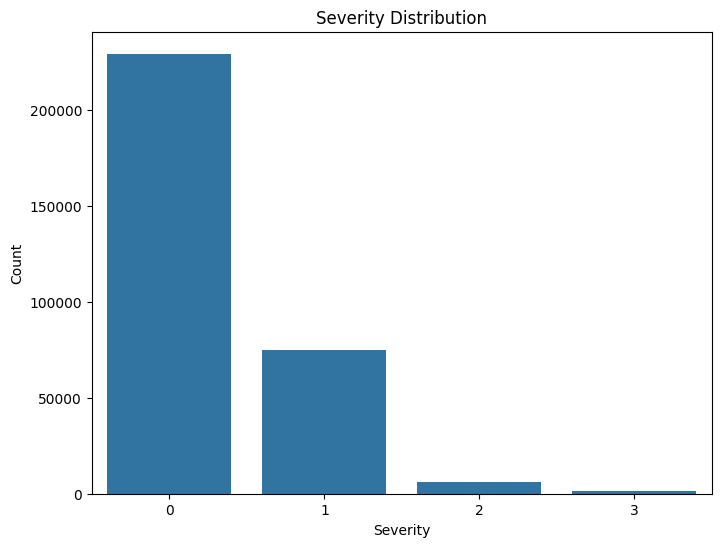

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.countplot(x='Severity', data=data)
plt.title('Severity Distribution')
plt.xlabel('Severity')
plt.ylabel('Count')
plt.show()

# Treino (MPL)

In [ ]:
batch_size = 32
epochs = 5

## MPL

Epoch 1/5
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step - accuracy: 0.9578 - loss: 0.1488 - val_accuracy: 0.9768 - val_loss: 0.0870 - learning_rate: 0.0010
Epoch 2/5
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - accuracy: 0.9754 - loss: 0.0883 - val_accuracy: 0.9769 - val_loss: 0.0861 - learning_rate: 0.0010
Epoch 3/5
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step - accuracy: 0.9751 - loss: 0.0865 - val_accuracy: 0.9769 - val_loss: 0.0860 - learning_rate: 0.0010
Epoch 4/5
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step - accuracy: 0.9751 - loss: 0.0855 - val_accuracy: 0.9768 - val_loss: 0.0869 - learning_rate: 0.0010
Epoch 5/5
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - accuracy: 0.9753 - loss: 0.0827 - val_accuracy: 0.9766 - val_loss: 0.0887 - learning_rate: 0.0010
1947/1947 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step
              precision    recall  f1-score   support

           0     0.9999    1.0000    1.0000     45807
           1     0.9074    0.9999    0.9514     14938
           2     0.0000 

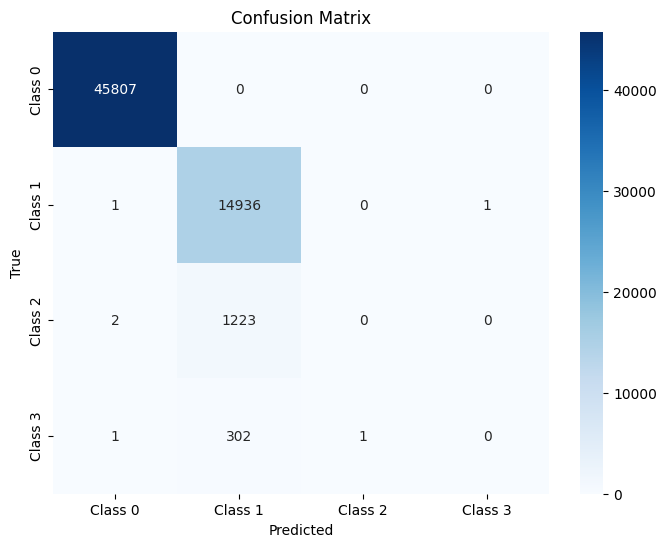

Specificidade média: 0.9919
Sensibilidade média: 0.5000
G-Mean (macro):      0.0000
[[45807     0     0     0]
 [    1 14936     0     1]
 [    2  1223     0     0]
 [    1   302     1     0]]


In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf

inputs = tf.keras.Input(shape=(X.shape[1],))
x = tf.keras.layers.Dense(64, activation='relu')(inputs)
x = tf.keras.layers.Dense(64, activation='relu')(x)
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)

model = tf.keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

batch_size = 32
epochs = 5

history = model.fit(
    X_train,
    y_train,
    validation_split=0.2,
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[
        tf.keras.callbacks.ReduceLROnPlateau(),#se val_loss não melhorar reduz-se a learning rate
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=3, #se val_loss não melhorar para após 3 epochs
            restore_best_weights=True
        )
    ]
)

# ---------- avaliação ----------
y_pred_probs = model.predict(X_test)
y_pred       = np.argmax(y_pred_probs, axis=1)

print(classification_report(y_test, y_pred, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# ---------- Specificidade, Sensibilidade e G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")
print(cm)

##  MPL (Weighted)

Pesos atribuídos: {0: 1.0, 1: 1.4802288894651925, 2: 3.5522992209581177, 3: 5.7868929309419475}
              precision    recall  f1-score   support

           0     0.9998    1.0000    0.9999     45807
           1     0.9100    0.9938    0.9501     14938
           2     0.2400    0.0049    0.0096      1225
           3     0.2119    0.0822    0.1185       304

    accuracy                         0.9745     62274
   macro avg     0.5904    0.5202    0.5195     62274
weighted avg     0.9594    0.9745    0.9641     62274



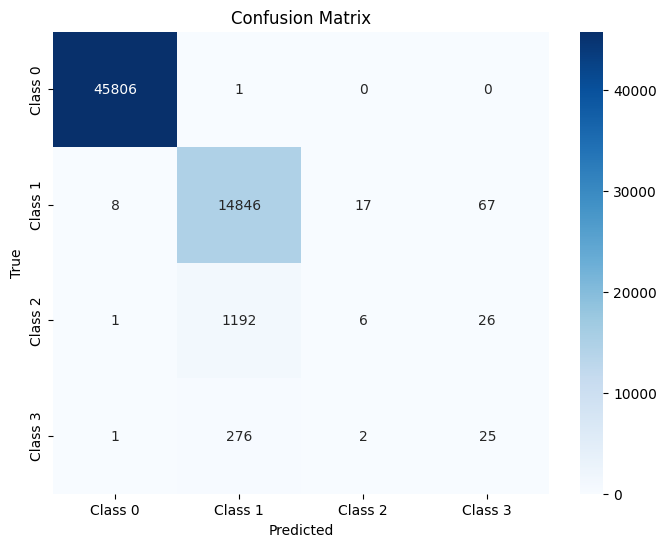

[[45806     1     0     0]
 [    8 14846    17    67]
 [    1  1192     6    26]
 [    1   276     2    25]]
Specificidade média: 0.9916
Sensibilidade média: 0.5202
G-Mean (macro):      0.1414


In [ ]:
import numpy as np, math, tensorflow as tf, matplotlib.pyplot as plt, seaborn as sns
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix

# ------------------------------------------------------------------
# 1.  pesos de classe (α = 0.35)
# ------------------------------------------------------------------
def make_class_weights(y, alpha=0.35):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha
    return {int(i): float(w[i]) for i in range(len(counts))}

class_w = make_class_weights(y_train, alpha=0.35)
print("Pesos atribuídos:", class_w)

# ------------------------------------------------------------------
# 2.  arquitectura MLP
# ------------------------------------------------------------------
inputs  = tf.keras.Input(shape=(X.shape[1],), dtype=tf.float32)
x       = tf.keras.layers.Dense(64, activation='relu')(inputs)
x       = tf.keras.layers.Dense(64, activation='relu')(x)
outputs = tf.keras.layers.Dense(4,  activation='softmax')(x)

model = tf.keras.Model(inputs, outputs)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# ------------------------------------------------------------------
# 3.  treino
# ------------------------------------------------------------------
history = model.fit(
    X_train.astype(np.float32),
    y_train.astype(np.int32),
    validation_split=0.2,
    epochs=20,
    batch_size=32,
    class_weight=class_w,
    callbacks=[
        tf.keras.callbacks.ReduceLROnPlateau(),
        tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                         patience=3,
                                         restore_best_weights=True)
    ],
    verbose=0
)

# ------------------------------------------------------------------
# 4.  avaliação
# ------------------------------------------------------------------
y_pred = model.predict(X_test.astype(np.float32), verbose=0).argmax(1)

print(classification_report(y_test, y_pred, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2, 3])

plt.figure(figsize=(8,6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3'],
    yticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3']
)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()
print(cm)

# ------------------------------------------------------------------
# 5.  Specificidade, Sensibilidade, G-Mean
# ------------------------------------------------------------------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")


In [ ]:
# ---------- Macro F1 calculation ----------
from sklearn.metrics import f1_score
# Calcula o Macro F1 Score
macro_f1 = f1_score(y_test, y_pred, average='macro')
print(f"Macro F1 Score: {macro_f1:.4f}")

Macro F1 Score: 0.4892


## Undersampling MPL

Epoch 1/5
122/122 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.4376 - loss: 1.2542 - val_accuracy: 0.0165 - val_loss: 2.6942 - learning_rate: 0.0010
Epoch 2/5
122/122 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7309 - loss: 0.6271 - val_accuracy: 0.0607 - val_loss: 2.3408 - learning_rate: 0.0010
Epoch 3/5
122/122 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7677 - loss: 0.5230 - val_accuracy: 0.0586 - val_loss: 2.5598 - learning_rate: 0.0010
Epoch 4/5
122/122 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7950 - loss: 0.4641 - val_accuracy: 0.0926 - val_loss: 2.5512 - learning_rate: 0.0010
Epoch 5/5
122/122 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7966 - loss: 0.4432 - val_accuracy: 0.0658 - val_loss: 2.9446 - learning_rate: 0.0010
1947/1947 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step
              precision    recall  f1-score   support

           0     0.9984    0.9847    0.9915     45807
           1     0.9173    0.5893    0.7176     14938
           2     0.0946    0.5445    0.

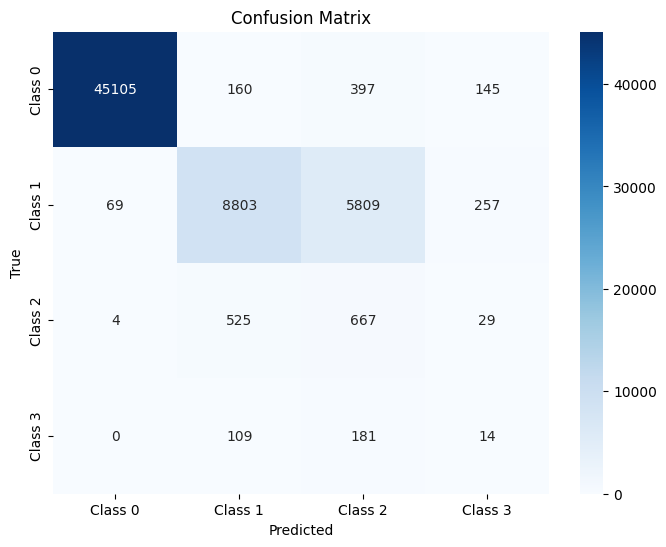

[[45105   160   397   145]
 [   69  8803  5809   257]
 [    4   525   667    29]
 [    0   109   181    14]]
Specificidade média: 0.9668
Sensibilidade média: 0.5411
G-Mean (macro):      0.3473


In [ ]:
from imblearn.under_sampling import RandomUnderSampler

undersampler = RandomUnderSampler(random_state=100)
X_train_undersampled, y_train_undersampled = undersampler.fit_resample(X_train, y_train)

inputs_undersampled = tf.keras.Input(shape=(X_train_undersampled.shape[1],))
x_undersampled = tf.keras.layers.Dense(64, activation='relu')(inputs_undersampled)
x_undersampled = tf.keras.layers.Dense(64, activation='relu')(x_undersampled)
outputs_undersampled = tf.keras.layers.Dense(4, activation='softmax')(x_undersampled)

model_undersampled = tf.keras.Model(inputs_undersampled, outputs_undersampled)

model_undersampled.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history_undersampled = model_undersampled.fit(
    X_train_undersampled,
    y_train_undersampled,
    validation_split=0.2,
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[
        tf.keras.callbacks.ReduceLROnPlateau(),
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=3,
            restore_best_weights=True
        )
    ]
)

# ---------- avaliação ----------
y_pred_probs_undersampled = model_undersampled.predict(X_test)
y_pred_undersampled      = np.argmax(y_pred_probs_undersampled, axis=1)

print(classification_report(y_test, y_pred_undersampled, digits=4))

cm = confusion_matrix(y_test, y_pred_undersampled, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()
print(cm)



# ---------- Specificidade, Sensibilidade e G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")



In [ ]:
# ---------- Macro F1 calculation ----------
from sklearn.metrics import f1_score
# Calcula o Macro F1 Score
macro_f1 = f1_score(y_test, y_pred_undersampled, average='macro')
print(f"Macro F1 Score: {macro_f1:.4f}")

Macro F1 Score: 0.4890


## Undersampling MPL (Weighted)






Pesos atribuídos: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0}
 — val_gmean: 0.3894
 — val_gmean: 0.5144
 — val_gmean: 0.5737
 — val_gmean: 0.6217
 — val_gmean: 0.6435
 — val_gmean: 0.6728
 — val_gmean: 0.6857
 — val_gmean: 0.6875
 — val_gmean: 0.7094
 — val_gmean: 0.7122
 — val_gmean: 0.7027
 — val_gmean: 0.7299
 — val_gmean: 0.7454
 — val_gmean: 0.7525
 — val_gmean: 0.7624
 — val_gmean: 0.7689
 — val_gmean: 0.7676
 — val_gmean: 0.7730
 — val_gmean: 0.7919
 — val_gmean: 0.7953
 — val_gmean: 0.8052
 — val_gmean: 0.8158
 — val_gmean: 0.8127
 — val_gmean: 0.8306
 — val_gmean: 0.8315
 — val_gmean: 0.8380
 — val_gmean: 0.8381
 — val_gmean: 0.8525
 — val_gmean: 0.8553
 — val_gmean: 0.8583
 — val_gmean: 0.8662
 — val_gmean: 0.8654
 — val_gmean: 0.8785
 — val_gmean: 0.8836
 — val_gmean: 0.8795
 — val_gmean: 0.8928
 — val_gmean: 0.8930
 — val_gmean: 0.8952
 — val_gmean: 0.8925
 — val_gmean: 0.9002
 — val_gmean: 0.9147
 — val_gmean: 0.9180
 — val_gmean: 0.9248
 — val_gmean: 0.9274
 — val_gmean: 0.9241
 — v

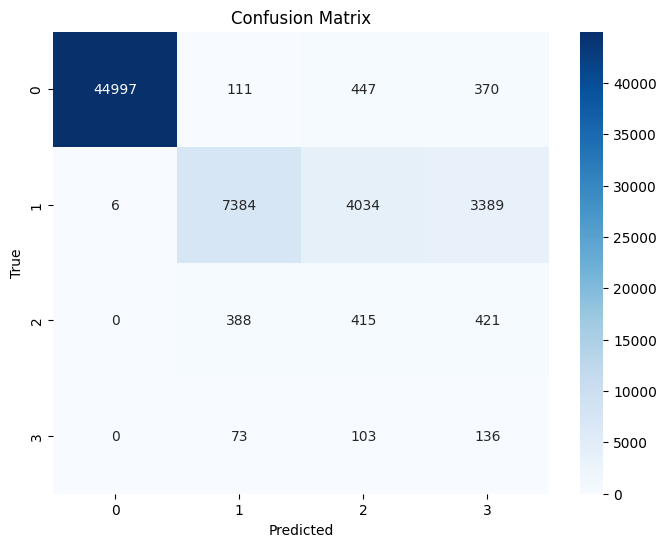

[[44997   111   447   370]
 [    6  7384  4034  3389]
 [    0   388   415   421]
 [    0    73   103   136]]


In [ ]:
import numpy as np, tensorflow as tf, math, gc, matplotlib.pyplot as plt, seaborn as sns
from sklearn.utils import class_weight
from sklearn.metrics import confusion_matrix, classification_report

# --------------------------- 1.  class_weight ---------------------------
def make_class_weights(y, alpha=0.3):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha          # suaviza com potência α
    return {int(i): float(w[i]) for i in range(len(counts))}

class_w = make_class_weights(y_train_undersampled, alpha=0.5)
print("Pesos atribuídos:", class_w)
# ex.: {0:1.0, 1:1.76, 2:11.3, 3:22.7}

# --------------------------- 2.  callback para val_gmean ---------------------------
class ValGMean(tf.keras.callbacks.Callback):
    def __init__(self, val_data):
        super().__init__()
        self.X_val, self.y_val = val_data
    def on_epoch_end(self, epoch, logs=None):
        y_pred = self.model.predict(self.X_val, batch_size=1024, verbose=0).argmax(1)
        cm     = confusion_matrix(self.y_val, y_pred, labels=[0,1,2,3])
        recalls = [(cm[i,i] / (cm[i,:].sum() + 1e-10)) for i in range(4)]
        gmean   = math.prod(recalls) ** 0.25
        logs = logs or {}
        logs['val_gmean'] = gmean
        print(f" — val_gmean: {gmean:.4f}")

# --------------------------- 3.  modelo MLP com Input() ---------------------------
def make_mlp(n_features):
    inp = tf.keras.Input(shape=(n_features,), dtype=tf.float32)
    x   = tf.keras.layers.Dense(128, activation='relu')(inp)
    x   = tf.keras.layers.Dropout(0.3)(x)
    x   = tf.keras.layers.Dense(64,  activation='relu')(x)
    out = tf.keras.layers.Dense(4,   activation='softmax')(x)
    model = tf.keras.Model(inp, out)
    model.compile(optimizer='adam',
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
    return model

model = make_mlp(X_train_undersampled.shape[1])

# --------------------------- 4.  treino com val_gmean ---------------------------
X_val, y_val = X_train_undersampled[-5000:], y_train_undersampled[-5000:]
gmean_cb = ValGMean((X_val.astype(np.float32), y_val))
early_cb = tf.keras.callbacks.EarlyStopping(monitor='val_gmean',
                                            mode='max', patience=5,
                                            restore_best_weights=True)

history = model.fit(
    X_train_undersampled.astype(np.float32),
    y_train_undersampled.astype(np.int32),
    epochs=50, batch_size=256,
    class_weight=class_w,
    validation_data=(X_val.astype(np.float32), y_val),
    callbacks=[gmean_cb, early_cb,
               tf.keras.callbacks.ReduceLROnPlateau()],
    verbose=0,
)

# --------------------------- 5.  avaliação final ---------------------------
y_pred = model.predict(X_test.astype(np.float32), batch_size=1024, verbose=0).argmax(1)

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum() - tp
    fp = cm[:,i].sum() - tp; tn = cm.sum() - (tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10))
    specs.append(tn/(tn+fp+1e-10))

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25

print(classification_report(y_test, y_pred, digits=4))
print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['0','1','2','3'], yticklabels=['0','1','2','3'])
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

In [ ]:
# ---------- Macro F1 calculation ----------
from sklearn.metrics import f1_score
# Calcula o Macro F1 Score
macro_f1 = f1_score(y_test, y_pred, average='macro')
print(f"Macro F1 Score: {macro_f1:.4f}")

Macro F1 Score: 0.5111


## Oversampling MPL



In [ ]:
from imblearn.over_sampling import SMOTE

oversampler = SMOTE(random_state=100)
X_train_oversampled, y_train_oversampled = oversampler.fit_resample(X_train, y_train)

Epoch 1/5
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 62s 3ms/step - accuracy: 0.7786 - loss: 0.4812 - val_accuracy: 0.8815 - val_loss: 0.3341 - learning_rate: 0.0010
Epoch 2/5
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 61s 3ms/step - accuracy: 0.9058 - loss: 0.2331 - val_accuracy: 0.8629 - val_loss: 0.3776 - learning_rate: 0.0010
Epoch 3/5
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 64s 3ms/step - accuracy: 0.9280 - loss: 0.1821 - val_accuracy: 0.8606 - val_loss: 0.3766 - learning_rate: 0.0010
Epoch 4/5
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 66s 4ms/step - accuracy: 0.9382 - loss: 0.1571 - val_accuracy: 0.9339 - val_loss: 0.1893 - learning_rate: 0.0010
Epoch 5/5
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 68s 4ms/step - accuracy: 0.9456 - loss: 0.1397 - val_accuracy: 0.9302 - val_loss: 0.1928 - learning_rate: 0.0010
              precision    recall  f1-score   support

           0     0.9998    0.9998    0.9998     45807
           1     0.9156    0.8704    0.8924     14938
           2     0.1110    0.1722    0.1350      1225
   

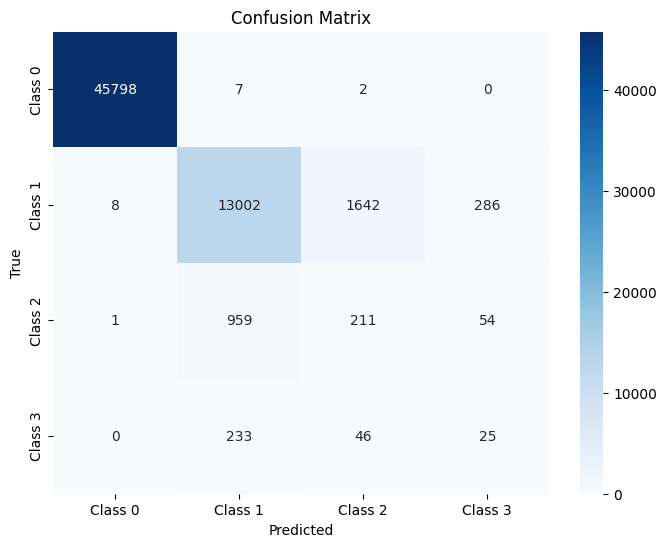

[[45798     7     2     0]
 [    8 13002  1642   286]
 [    1   959   211    54]
 [    0   233    46    25]]
Specificidade média: 0.9852
Sensibilidade média: 0.5312
G-Mean (macro):      0.3332


In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

inputs_oversampled = tf.keras.Input(shape=(X_train_oversampled.shape[1],))
x_oversampled = tf.keras.layers.Dense(64, activation='relu')(inputs_oversampled)
x_oversampled = tf.keras.layers.Dense(64, activation='relu')(x_oversampled)
outputs_oversampled = tf.keras.layers.Dense(4, activation='softmax')(x_oversampled)

model_oversampled = tf.keras.Model(inputs_oversampled, outputs_oversampled)

model_oversampled.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

history_oversampled = model_oversampled.fit(
    X_train_oversampled,
    y_train_oversampled,
    validation_split=0.2,
    batch_size=batch_size,
    epochs=epochs,
    callbacks=[
        tf.keras.callbacks.ReduceLROnPlateau(),
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=3,
            restore_best_weights=True
        )
    ]
)

# ---------- avaliação ----------
y_pred_probs_oversampled = model_oversampled.predict(X_test, batch_size=1024, verbose=0)
y_pred_oversampled       = np.argmax(y_pred_probs_oversampled, axis=1)

print(classification_report(y_test, y_pred_oversampled, digits=4))

cm = confusion_matrix(y_test, y_pred_oversampled, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

# ---------- Specificidade, Sensibilidade e G-Mean ----------
import math
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")

### Oversampling MLP 50%

sampling_strategy = {1: 91555, 2: 91555, 3: 91555}
Distribuição após SMOTE 50 %: [183110  91555  91555  91555]
              precision    recall  f1-score   support

     Class 0     0.9999    0.9998    0.9998     45925
     Class 1     0.9133    0.8862    0.8995     14813
     Class 2     0.1175    0.1895    0.1451      1224
     Class 3     0.0000    0.0000    0.0000       312

    accuracy                         0.9518     62274
   macro avg     0.5077    0.5189    0.5111     62274
weighted avg     0.9569    0.9518    0.9542     62274



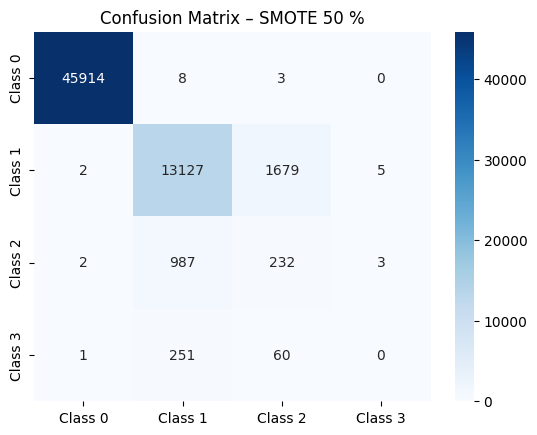

Specificidade média: 0.9862
Sensibilidade média: 0.5189
G-Mean (macro):      0.0000


In [ ]:
import numpy as np, math, tensorflow as tf, matplotlib.pyplot as plt, seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# ------------------------------------------------------------
# 1.  Construir sampling_strategy  (metade da classe maioritária)
# ------------------------------------------------------------
counts   = np.bincount(y_train)
maj_size = counts.max()
target   = int(maj_size * 0.50)                # 50 % da maior

strategy = {cls: target for cls, n in enumerate(counts) if n < target}
print("sampling_strategy =", strategy)
#  exemplo esperado: {1:114518, 2:114518, 3:114518}

# ------------------------------------------------------------
# 2.  SMOTE parcial
# ------------------------------------------------------------
sm   = SMOTE(sampling_strategy=strategy, random_state=100)
X_tr, y_tr = sm.fit_resample(X_train_scaled, y_train)

print("Distribuição após SMOTE 50 %:", np.bincount(y_tr))

# ------------------------------------------------------------
# 3.  MLP simples (o mesmo que vinhas a usar)
# ------------------------------------------------------------
inputs  = tf.keras.Input(shape=(X_tr.shape[1],))
x       = tf.keras.layers.Dense(64, activation='relu')(inputs)
x       = tf.keras.layers.Dense(64, activation='relu')(x)
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)

model = tf.keras.Model(inputs, outputs)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_tr, y_tr,
          validation_split=0.2,
          batch_size=batch_size,
          epochs=epochs,
          callbacks=[tf.keras.callbacks.ReduceLROnPlateau(),
                     tf.keras.callbacks.EarlyStopping(patience=3,
                                                      restore_best_weights=True)],
          verbose=0)

# ------------------------------------------------------------
# 4.  Avaliação
# ------------------------------------------------------------
y_pred_probs = model.predict(X_test_scaled, batch_size=1024, verbose=0)
y_pred       = np.argmax(y_pred_probs, axis=1)

class_names = ['Class 0','Class 1','Class 2','Class 3']
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix – SMOTE 50 %'); plt.show()

# ---------- Specificidade, Sensibilidade, G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum() - tp
    fp = cm[:,i].sum() - tp; tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))
    specs.append(tn / (tn + fp + 1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


## Oversampling MPL (Weighted)

In [ ]:
import numpy as np, math, tensorflow as tf, matplotlib.pyplot as plt, seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# ------------------------------------------------------------------
# 0.  Oversampling (SMOTE) e escala dos atributos
# ------------------------------------------------------------------
oversampler = SMOTE(random_state=100)
X_train_oversampled, y_train_oversampled = oversampler.fit_resample(X_train, y_train)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_oversampled)
X_test_scaled  = scaler.transform(X_test)

# ------------------------------------------------------------------
# 1.  Pesos de classe suavizados   w_c = (N/n_c)^α
# ------------------------------------------------------------------
def make_class_weights(y, alpha=0.3):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha
    return {int(i): float(w[i]) for i in range(len(counts))}

class_w = make_class_weights(y_train_oversampled, alpha=0.5)
print("Pesos atribuídos:", class_w)

# ------------------------------------------------------------------
# 2.  Callback para G-Mean na validação
# ------------------------------------------------------------------
class ValGMean(tf.keras.callbacks.Callback):
    def __init__(self, val_data):
        super().__init__()
        self.X_val, self.y_val = val_data
    def on_epoch_end(self, epoch, logs=None):
        y_pred = self.model.predict(self.X_val, batch_size=1024, verbose=0).argmax(1)
        cm     = confusion_matrix(self.y_val, y_pred, labels=[0,1,2,3])
        recalls = [(cm[i,i] / (cm[i,:].sum() + 1e-10)) for i in range(4)]
        gmean   = math.prod(recalls) ** 0.25
        logs = logs or {}
        logs['val_gmean'] = gmean
        print(f" — val_gmean: {gmean:.4f}")

# separa validação manualmente (20 %)
X_tr, X_val, y_tr, y_val = train_test_split(
    X_train_scaled, y_train_oversampled, test_size=0.2, random_state=100, stratify=y_train_oversampled
)

# ------------------------------------------------------------------
# 3.  Construção do MLP
# ------------------------------------------------------------------
inputs  = tf.keras.Input(shape=(X_tr.shape[1],), dtype=tf.float32)
x       = tf.keras.layers.Dense(64, activation='relu')(inputs)
x       = tf.keras.layers.Dropout(0.3)(x)
x       = tf.keras.layers.Dense(64, activation='relu')(x)
x       = tf.keras.layers.Dropout(0.3)(x)
outputs = tf.keras.layers.Dense(4, activation='softmax')(x)
model   = tf.keras.Model(inputs, outputs)

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# ------------------------------------------------------------------
# 4.  Treino
# ------------------------------------------------------------------
history = model.fit(
    X_tr, y_tr,
    epochs=5,
    batch_size=32,
    class_weight=class_w,
    validation_data=(X_val, y_val),
    callbacks=[
        ValGMean((X_val, y_val)),
        tf.keras.callbacks.EarlyStopping(monitor='val_gmean',
                                         mode='max', patience=5,
                                         restore_best_weights=True)
    ],
    verbose=0
)

# ------------------------------------------------------------------
# 5.  Avaliação final
# ------------------------------------------------------------------
y_pred_probs = model.predict(X_test_scaled, batch_size=1024, verbose=0)
y_pred       = np.argmax(y_pred_probs, axis=1)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

# ---------- Specificidade, Sensibilidade e G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i,i]
    fn = cm[i,:].sum() - tp
    fp = cm[:,i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensibilidade / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificidade

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")


Pesos atribuídos: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0}


# Treino de outros modelos


##libraries



In [ ]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE, RandomOverSampler, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

## Treino (Random forest)


### Random Forest

              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9082    0.9914    0.9480     14938
     Class 2     0.1591    0.0171    0.0310      1225
     Class 3     0.1429    0.0132    0.0241       304

    accuracy                         0.9738     62274
   macro avg     0.5525    0.5054    0.5008     62274
weighted avg     0.9573    0.9738    0.9637     62274



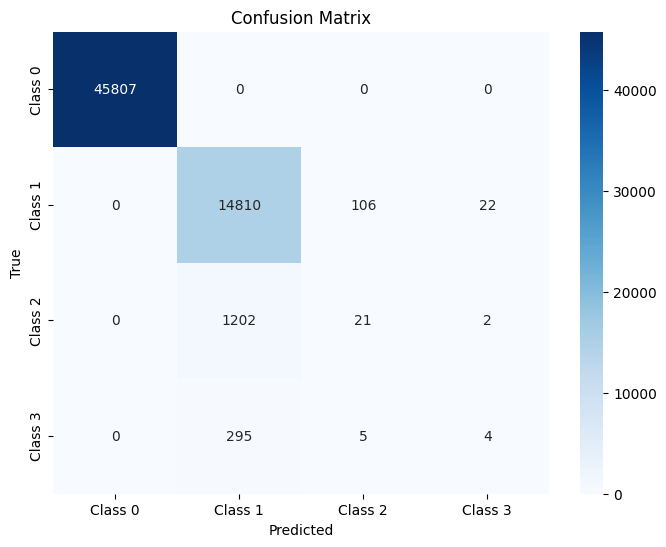

[[45807     0     0     0]
 [    0 14810   106    22]
 [    0  1202    21     2]
 [    0   295     5     4]]
Specificidade média: 0.9915
Sensibilidade média: 0.5054
G-Mean (macro):      0.1223


In [ ]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
import math

# ------------------------------------------------------------
# 1.  Escalar os atributos
# ------------------------------------------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# ------------------------------------------------------------
# 2.  Random Forest
# ------------------------------------------------------------
rf_model = RandomForestClassifier(
    n_estimators=400,
    random_state=100,
    n_jobs=-1
)
rf_model.fit(X_train_scaled, y_train)

# ------------------------------------------------------------
# 3.  Avaliação
# ------------------------------------------------------------
y_pred_rf = rf_model.predict(X_test_scaled)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred_rf, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred_rf, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

# ---------- Specificidade, Sensibilidade, G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")


### Random forest (Weighted)

Pesos atribuídos: {0: 1.0, 1: 1.4788130951536935, 2: 3.551244661859844, 3: 5.798980887507968}
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45925
     Class 1     0.9069    0.9875    0.9455     14813
     Class 2     0.1290    0.0196    0.0340      1224
     Class 3     0.0294    0.0032    0.0058       312

    accuracy                         0.9728     62274
   macro avg     0.5163    0.5026    0.4963     62274
weighted avg     0.9559    0.9728    0.9631     62274



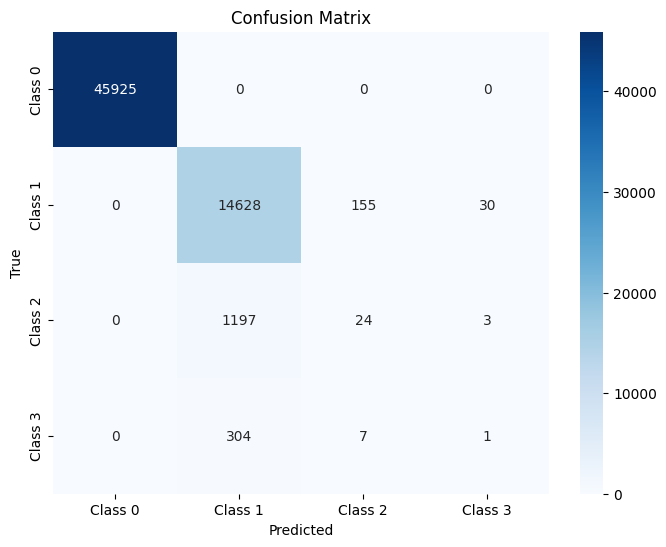

[[45925     0     0     0]
 [    0 14628   155    30]
 [    0  1197    24     3]
 [    0   304     7     1]]
Specificidade média: 0.9913
Sensibilidade média: 0.5026
G-Mean (macro):      0.0888


In [ ]:
import numpy as np, math
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns, matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# ------------------------------------------------------------
# 1.  Escalar atributos
# ------------------------------------------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# ------------------------------------------------------------
# 2.  Pesos de classe (α = 0.35)
# ------------------------------------------------------------
def make_class_weights(y, alpha=0.3):
    counts = np.bincount(y)
    N      = counts.max()              # classe majoritária
    w      = (N / counts) ** alpha     # suavização
    return {int(i): float(w[i]) for i in range(len(counts))}

class_w = make_class_weights(y_train, alpha=0.35)
print("Pesos atribuídos:", class_w)
# ex.: {0:1.0, 1:1.4, 2:4.6, 3:7.8}

# ------------------------------------------------------------
# 3.  Random Forest
# ------------------------------------------------------------
rf_model = RandomForestClassifier(
    n_estimators=400,
    random_state=100,
    n_jobs=-1,
    class_weight=class_w
)
rf_model.fit(X_train_scaled, y_train)

# ------------------------------------------------------------
# 4.  Avaliação
# ------------------------------------------------------------
y_pred_rf = rf_model.predict(X_test_scaled)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred_rf, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred_rf, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

# ---------- Specificidade, Sensibilidade e G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")


### Undersampling RF

Distribuição pós-RUS: [1215 1215 1215 1215]
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9426    0.5301    0.6786     14938
     Class 2     0.0915    0.3224    0.1426      1225
     Class 3     0.0416    0.5132    0.0769       304

    accuracy                         0.8716     62274
   macro avg     0.5189    0.5914    0.4745     62274
weighted avg     0.9637    0.8716    0.9015     62274



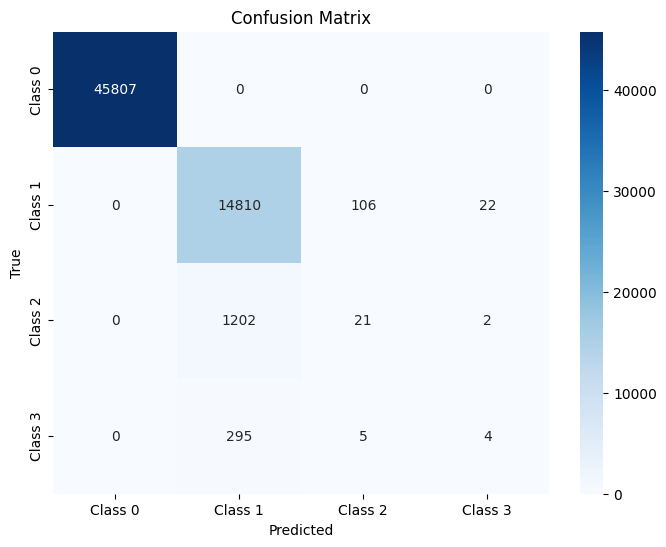

[[45807     0     0     0]
 [    0 14810   106    22]
 [    0  1202    21     2]
 [    0   295     5     4]]
Specificidade média: 0.9915
Sensibilidade média: 0.5054
G-Mean (macro):      0.1223


In [ ]:
import numpy as np, math, matplotlib.pyplot as plt, seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.under_sampling import RandomUnderSampler

# 1. Escalar atributos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# 2. RandomUnderSampler
rus = RandomUnderSampler(random_state=100)
X_train_rus, y_train_rus = rus.fit_resample(X_train_scaled, y_train)
print("Distribuição pós-RUS:", np.bincount(y_train_rus))

# 3. Random Forest
rf_rus = RandomForestClassifier(n_estimators=400, random_state=100, n_jobs=-1)
rf_rus.fit(X_train_rus, y_train_rus)

# 4. Avaliação
y_pred_rus = rf_rus.predict(X_test_scaled)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred_rus, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred_rus, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)
# Métricas extra
specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp; fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))
print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### Undersampling RF (Weighted)

In [ ]:
import numpy as np, math, matplotlib.pyplot as plt, seaborn as sns
from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# ------------------------------------------------------------------
# 1.  Escalar atributos
# ------------------------------------------------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)


# ------------------------------------------------------------------
# 3.  Pesos de classe
# ------------------------------------------------------------------
def make_class_weights(y, alpha=0.3):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha
    return {int(i): float(w[i]) for i in range(len(counts))}

class_w = make_class_weights(y_train_undersampled, alpha=0.3)
print("Pesos atribuídos:", class_w)
# ex.: {0:1.0, 1:1.76, 2:11.3, 3:22.7}

# ------------------------------------------------------------------
# 2.  Random under-sampling
# ------------------------------------------------------------------
rus = RandomUnderSampler(random_state=100)
X_train_undersampled, y_train_undersampled = rus.fit_resample(X_train_scaled, y_train)

print("Distribuição após RUS:", np.bincount(y_train_undersampled))

# ------------------------------------------------------------------
# 4.  Random Forest com os novos pesos
# ------------------------------------------------------------------
rf_model = RandomForestClassifier(
    n_estimators=400,
    random_state=100,
    n_jobs=-1,
    class_weight=class_w
)
rf_model.fit(X_train_undersampled, y_train_undersampled)

# ------------------------------------------------------------------
# 5.  Avaliação
# ------------------------------------------------------------------
y_pred = rf_model.predict(X_test_scaled)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

# ---------- Specificidade, Sensibilidade e G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")


### Oversampling RF

Distribuição pós-SMOTE: [183228 183228 183228 183228]
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9087    0.9864    0.9460     14938
     Class 2     0.1394    0.0237    0.0405      1225
     Class 3     0.1136    0.0164    0.0287       304

    accuracy                         0.9727     62274
   macro avg     0.5404    0.5066    0.5038     62274
weighted avg     0.9569    0.9727    0.9634     62274



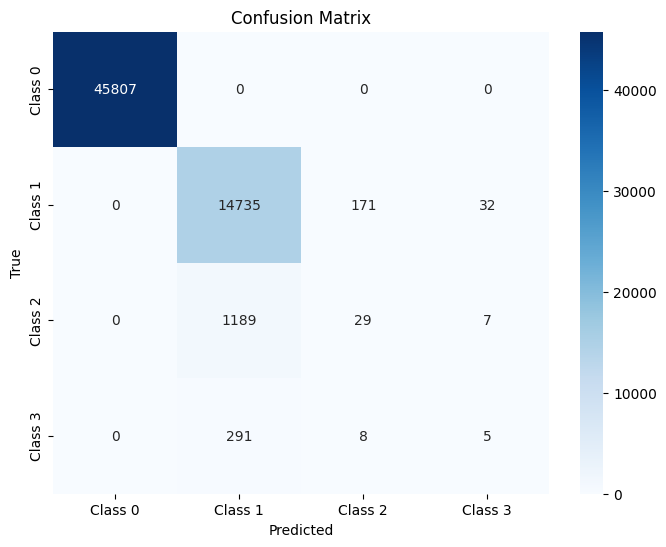

[[45807     0     0     0]
 [    0 14735   171    32]
 [    0  1189    29     7]
 [    0   291     8     5]]
Specificidade média: 0.9913
Sensibilidade média: 0.5066
G-Mean (macro):      0.1400


In [ ]:
import numpy as np, math, matplotlib.pyplot as plt, seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE

# 1. Escalar atributos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# 2. SMOTE
sm = SMOTE(random_state=100)
X_train_sm, y_train_sm = sm.fit_resample(X_train_scaled, y_train)
print("Distribuição pós-SMOTE:", np.bincount(y_train_sm))

# 3. Random Forest
rf_sm = RandomForestClassifier(n_estimators=400, random_state=100, n_jobs=-1)
rf_sm.fit(X_train_sm, y_train_sm)

# 4. Avaliação
y_pred_sm = rf_sm.predict(X_test_scaled)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred_sm, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred_sm, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

# Métricas extra
specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp; fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))
print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### Oversampling RF (Weighted)

In [ ]:
import numpy as np, math
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns, matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE

# ------------------------------------------------------------------
# 1.  Escalar atributos
# ------------------------------------------------------------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# ------------------------------------------------------------------
# 2.  SMOTE
# ------------------------------------------------------------------
oversampler = SMOTE(random_state=100)
X_train_oversampled, y_train_oversampled = oversampler.fit_resample(
    X_train_scaled, y_train
)
print("Distribuição pós-SMOTE:", np.bincount(y_train_oversampled))

# ------------------------------------------------------------------
# 3.  Pesos com suavização α = 0.5
# ------------------------------------------------------------------
def make_class_weights(y, alpha=0.5):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha
    return {int(i): float(w[i]) for i in range(len(counts))}

class_w = make_class_weights(y_train_oversampled, alpha=0.5)
print("Pesos atribuídos:", class_w)
# ex.: {0:1.0, 1:1.76, 2:11.3, 3:22.7}

# ------------------------------------------------------------------
# 4.  Random Forest
# ------------------------------------------------------------------
rf_model = RandomForestClassifier(
    n_estimators=400,
    random_state=100,
    n_jobs=-1,
    class_weight=class_w
)
rf_model.fit(X_train_oversampled, y_train_oversampled)

# ------------------------------------------------------------------
# 5.  Avaliação
# ------------------------------------------------------------------
y_pred = rf_model.predict(X_test_scaled)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)



# ---------- Specificidade, Sensibilidade, G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))          # Sensitivity / Recall
    specs.append(tn / (tn + fp + 1e-10))         # Specificity

mean_spec = np.mean(specs)
mean_sens = np.mean(sens)
g_mean    = math.prod(sens) ** 0.25              # raiz-4 do produto

print(f"Specificidade média: {mean_spec:.4f}")
print(f"Sensibilidade média: {mean_sens:.4f}")
print(f"G-Mean (macro):      {g_mean:.4f}")


Distribuição pós-SMOTE: [183110 183110 183110 183110]
Pesos atribuídos: {0: 1.0, 1: 1.0, 2: 1.0, 3: 1.0}


## Treino (XGBoost)

### XGBoost

              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9087    0.9973    0.9509     14938
     Class 2     0.2449    0.0098    0.0188      1225
     Class 3     0.3913    0.0296    0.0550       304

    accuracy                         0.9751     62274
   macro avg     0.6362    0.5092    0.5062     62274
weighted avg     0.9603    0.9751    0.9643     62274


=== XGB – Original ===


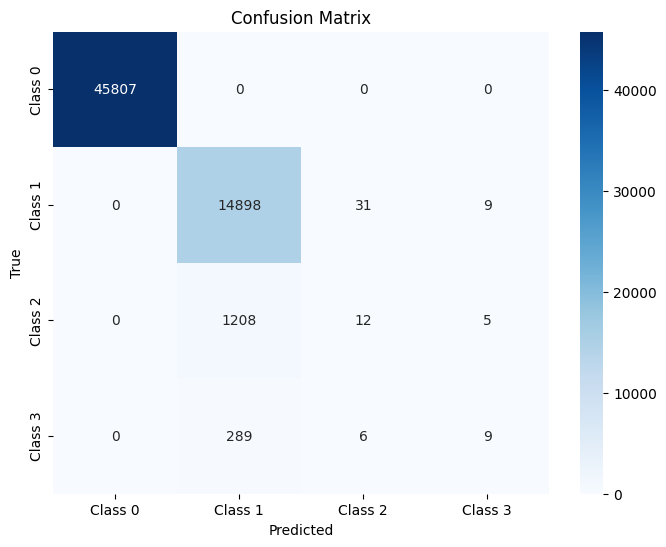

[[45807     0     0     0]
 [    0 14898    31     9]
 [    0  1208    12     5]
 [    0   289     6     9]]
Specificidade média: 0.9919
Sensibilidade média: 0.5092
G-Mean (macro):      0.1304


In [ ]:
import numpy as np, math
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt, seaborn as sns

# 1. Escalar
scaler = StandardScaler()
X_tr = scaler.fit_transform(X_train)
X_te = scaler.transform(X_test)

# 2. Modelo
xgb_orig = XGBClassifier(
    n_estimators=600, max_depth=8, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    objective='multi:softprob', num_class=4,
    eval_metric='mlogloss', random_state=100
)
xgb_orig.fit(X_tr, y_train)

# 3. Avaliação
y_pred = xgb_orig.predict(X_te)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))
print("\n=== XGB – Original ===")
cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp; fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))
print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### XGBoost (Weighted)

Pesos atribuídos: {0: 1.0, 1: 1.4802288894651925, 2: 3.5522992209581177, 3: 5.7868929309419475}

=== XGB – Original ===
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9114    0.9907    0.9494     14938
     Class 2     0.2215    0.0286    0.0506      1225
     Class 3     0.2500    0.0592    0.0957       304

    accuracy                         0.9741     62274
   macro avg     0.5957    0.5196    0.5239     62274
weighted avg     0.9598    0.9741    0.9648     62274



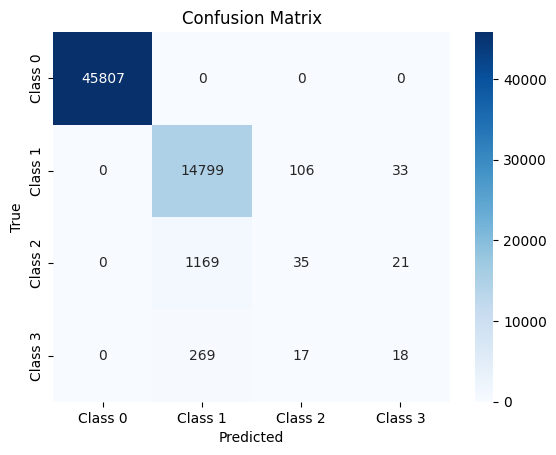

[[45807     0     0     0]
 [    0 14799   106    33]
 [    0  1169    35    21]
 [    0   269    17    18]]
Specificidade média: 0.9917
Sensibilidade média: 0.5196
G-Mean (macro):      0.2023


In [ ]:
import numpy as np, math, matplotlib.pyplot as plt, seaborn as sns
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# ------------------------------------------------------------
# 0.  Função de pesos suavizados
# ------------------------------------------------------------
def make_class_weights(y, alpha=0.35):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha          # suavização
    return {int(i): float(w[i]) for i in range(len(counts))}

# ------------------------------------------------------------
# 1.  Escalar atributos
# ------------------------------------------------------------
scaler = StandardScaler()
X_tr = scaler.fit_transform(X_train)
X_te = scaler.transform(X_test)

# ------------------------------------------------------------
# 2.  Pesos de classe (calculados no dataset original)
# ------------------------------------------------------------
class_w   = make_class_weights(y_train, alpha=0.35)
sample_w  = np.array([class_w[y] for y in y_train])  # 1 peso por amostra
print("Pesos atribuídos:", class_w)

# ------------------------------------------------------------
# 3.  Modelo XGBoost
# ------------------------------------------------------------
xgb_orig = XGBClassifier(
    n_estimators=300, max_depth=8, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    objective='multi:softprob', num_class=4,
    eval_metric='mlogloss', random_state=100
)
xgb_orig.fit(X_tr, y_train, sample_weight=sample_w)

# ------------------------------------------------------------
# 4.  Avaliação
# ------------------------------------------------------------
y_pred = xgb_orig.predict(X_te)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print("\n=== XGB – Original ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)
y_pred = xgb_orig.predict(X_te)

# ---------- Specificidade, Sensibilidade, G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i, i]
    fn = cm[i, :].sum() - tp
    fp = cm[:, i].sum() - tp
    tn = cm.sum() - (tp + fn + fp)
    sens.append(tp / (tp + fn + 1e-10))
    specs.append(tn / (tn + fp + 1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens) ** 0.25):.4f}")


### Undersampling XGBoost

Distribuição RUS: [1215 1215 1215 1215]

=== XGB – RUS ===
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9459    0.5426    0.6896     14938
     Class 2     0.0990    0.3673    0.1559      1225
     Class 3     0.0433    0.4770    0.0793       304

    accuracy                         0.8753     62274
   macro avg     0.5220    0.5967    0.4812     62274
weighted avg     0.9646    0.8753    0.9044     62274



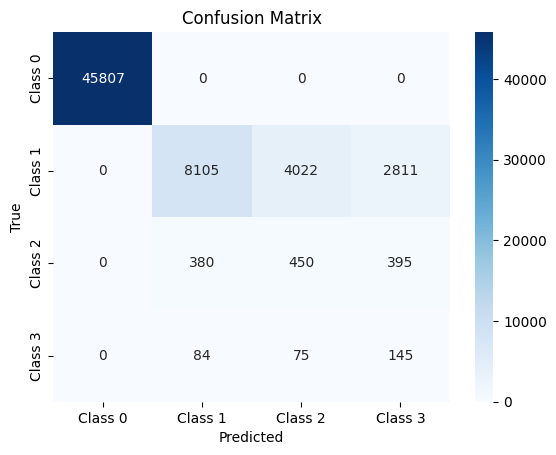

[[45807     0     0     0]
 [    0  8105  4022  2811]
 [    0   380   450   395]
 [    0    84    75   145]]
Specificidade média: 0.9678
Sensibilidade média: 0.5967
G-Mean (macro):      0.5553


In [ ]:
import numpy as np, math
from imblearn.under_sampling import RandomUnderSampler

# 1. Escalar
scaler = StandardScaler()
X_full = scaler.fit_transform(X_train)
X_te   = scaler.transform(X_test)

# 2. RUS
rus = RandomUnderSampler(random_state=100)
X_tr, y_tr = rus.fit_resample(X_full, y_train)
print("Distribuição RUS:", np.bincount(y_tr))

# 3. Modelo
xgb_rus = XGBClassifier(
    n_estimators=300, max_depth=8, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    objective='multi:softprob', num_class=4,
    eval_metric='mlogloss', random_state=100
)
xgb_rus.fit(X_tr, y_tr)

# 4. Avaliação
y_pred = xgb_rus.predict(X_te)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print("\n=== XGB – RUS ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp; fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))
print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### Undersampling XGBoost (Weighted)

Pesos originais: {0: 1.0, 1: 1.4788130951536935, 2: 3.551244661859844, 3: 5.798980887507968}
Distribuição pós-RUS: [73244 59875  4900  1207]

=== XGB – RUS + Pesos originais ===
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45925
     Class 1     0.9111    0.9841    0.9462     14813
     Class 2     0.2351    0.0482    0.0800      1224
     Class 3     0.1546    0.0481    0.0733       312

    accuracy                         0.9727     62274
   macro avg     0.5752    0.5201    0.5249     62274
weighted avg     0.9596    0.9727    0.9645     62274



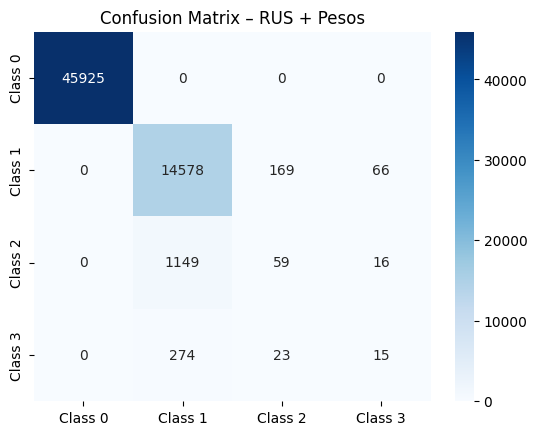

Specificidade média: 0.9914
Sensibilidade média: 0.5201
G-Mean (macro):      0.2185


In [ ]:
import numpy as np, math, matplotlib.pyplot as plt, seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.under_sampling import RandomUnderSampler
from xgboost import XGBClassifier

# ------------------------------------------------------------
# 0.  Função para pesos suavizados
# ------------------------------------------------------------
def make_class_weights(y, alpha=0.35):
    counts = np.bincount(y)
    N      = counts.max()
    w      = (N / counts) ** alpha          # suavização
    return {int(i): float(w[i]) for i in range(len(counts))}

# ------------------------------------------------------------
# 1.  Escalar atributos
# ------------------------------------------------------------
scaler = StandardScaler()
X_full = scaler.fit_transform(X_train)
X_te   = scaler.transform(X_test)

# ------------------------------------------------------------
# 2.  Pesos calculados (desequilibrado)
# ------------------------------------------------------------
class_w  = make_class_weights(y_train, alpha=0.35)
print("Pesos originais:", class_w)

# ------------------------------------------------------------
# 3.  Random Under-Sampler
# ------------------------------------------------------------
from collections import Counter
orig_counts   = Counter(y_train)
target_counts = {cls: (int(orig_counts[0]*0.40) if cls == 0 else orig_counts[cls])
                 for cls in orig_counts}
rus = RandomUnderSampler(sampling_strategy=target_counts, random_state=100)
X_tr, y_tr = rus.fit_resample(X_full, y_train)
print("Distribuição pós-RUS:", np.bincount(y_tr))

# ------------------------------------------------------------
# 4.  Amostrar pesos correspondentes a y_tr
# ------------------------------------------------------------
sample_w = np.array([class_w[y] for y in y_tr])

# ------------------------------------------------------------
# 5.  Modelo XGBoost
# ------------------------------------------------------------
xgb_rus = XGBClassifier(
    n_estimators=600, max_depth=8, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    objective='multi:softprob', num_class=4,
    eval_metric='mlogloss', random_state=100
)
xgb_rus.fit(X_tr, y_tr, sample_weight=sample_w)

# ------------------------------------------------------------
# 6.  Avaliação
# ------------------------------------------------------------
y_pred = xgb_rus.predict(X_te)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print("\n=== XGB – RUS + Pesos originais ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix – RUS + Pesos'); plt.show()

# ---------- Specificidade, Sensibilidade, G-Mean ----------
specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp
    fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### Oversampling XGBoost

Distribuição SMOTE: [183228 183228 183228 183228]

=== XGB – SMOTE ===
              precision    recall  f1-score   support

     Class 0     1.0000    1.0000    1.0000     45807
     Class 1     0.9097    0.9935    0.9498     14938
     Class 2     0.2043    0.0155    0.0288      1225
     Class 3     0.2500    0.0493    0.0824       304

    accuracy                         0.9744     62274
   macro avg     0.5910    0.5146    0.5153     62274
weighted avg     0.9590    0.9744    0.9644     62274



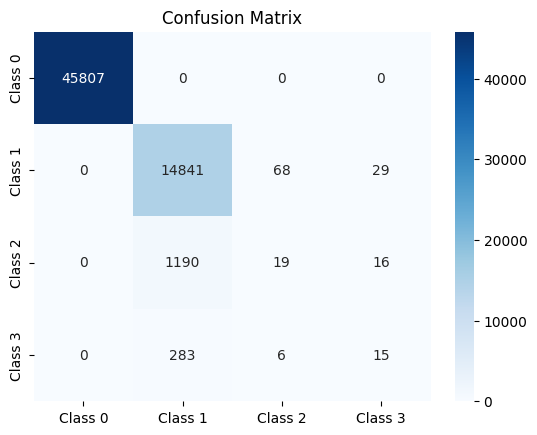

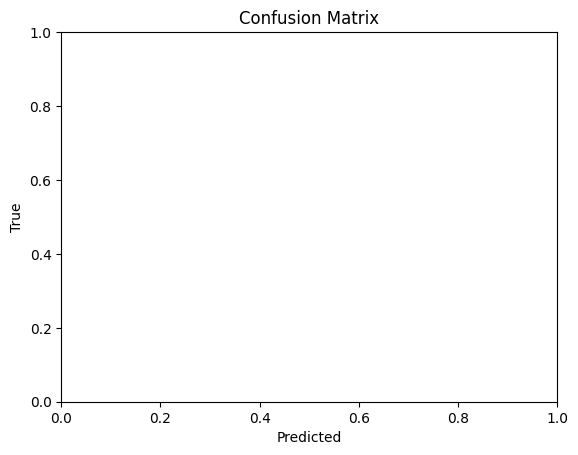

[[45807     0     0     0]
 [    0 14841    68    29]
 [    0  1190    19    16]
 [    0   283     6    15]]
Specificidade média: 0.9917
Sensibilidade média: 0.5146
G-Mean (macro):      0.1661


In [ ]:
from imblearn.over_sampling import SMOTE

# 1. Escalar
scaler = StandardScaler()
X_full = scaler.fit_transform(X_train)
X_te   = scaler.transform(X_test)

# 2. SMOTE
sm = SMOTE(random_state=100)
X_tr, y_tr = sm.fit_resample(X_full, y_train)
print("Distribuição SMOTE:", np.bincount(y_tr))

# 3. Modelo
xgb_sm = XGBClassifier(
    n_estimators=300, max_depth=8, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    objective='multi:softprob', num_class=4,
    eval_metric='mlogloss', random_state=100
)
xgb_sm.fit(X_tr, y_tr)

# 4. Avaliação
y_pred = xgb_sm.predict(X_te)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print("\n=== XGB – SMOTE ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp; fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))
print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")

In [ ]:
# 4. Avaliação
y_pred = xgb_sm.predict(X_te)

class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']
print("\n=== XGB – SMOTE ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))

cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

NameError: name 'xgb_sm' is not defined

### Oversampling XGBoost (Weighted)

Unique classes: [0 1 2 3]
Class distribution after SMOTE: [183110 183110 183110 183110]
Class weights: {np.int64(0): np.float64(1.0), np.int64(1): np.float64(1.0), np.int64(2): np.float64(1.5), np.int64(3): np.float64(4.0)}
              precision    recall  f1-score   support

     Class 0       1.00      1.00      1.00     45925
     Class 1       0.91      1.00      0.95     14813
     Class 2       0.39      0.01      0.02      1224
     Class 3       0.22      0.05      0.09       312

    accuracy                           0.97     62274
   macro avg       0.63      0.52      0.52     62274
weighted avg       0.96      0.97      0.96     62274



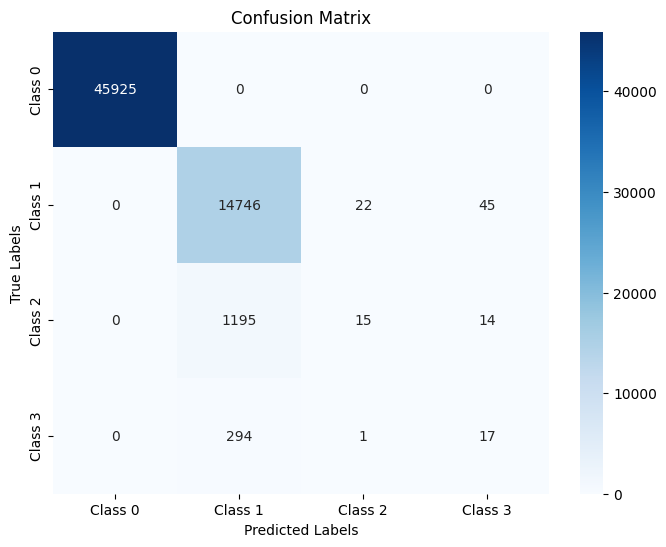

[[45925     0     0     0]
 [    0 14746    22    45]
 [    0  1195    15    14]
 [    0   294     1    17]]


In [ ]:
from imblearn.over_sampling import SMOTE

# 1. Escalar
scaler = StandardScaler()
X_full = scaler.fit_transform(X_train)
X_te   = scaler.transform(X_test)

# 2. SMOTE
sm = SMOTE(random_state=100)
X_tr, y_tr = sm.fit_resample(X_full, y_train)
print("Distribuição SMOTE:", np.bincount(y_tr))

# 3. Pesos
class_w = make_class_weights(y_tr, alpha=0.5)
sample_w = np.array([class_w[y] for y in y_tr])

# 4. Modelo
xgb_sm = XGBClassifier(
    n_estimators=300, max_depth=8, learning_rate=0.1,
    subsample=0.8, colsample_bytree=0.8,
    objective='multi:softprob', num_class=4,
    eval_metric='mlogloss', random_state=100
)
xgb_sm.fit(X_tr, y_tr, sample_weight=sample_w)

# 5. Avaliação
y_pred = xgb_sm.predict(X_te)

print("\n=== XGB – SMOTE ===")
print(classification_report(y_test, y_pred, target_names=class_names, digits=4))
cm = confusion_matrix(y_test, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix – SMOTE'); plt.show()

specs, sens = [], []
for i in range(4):
    tp=cm[i,i]; fn=cm[i,:].sum()-tp; fp=cm[:,i].sum()-tp; tn=cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10)); specs.append(tn/(tn+fp+1e-10))
print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


## Treino (DNN)

### DNN

Train counts: [183228  59750   4899   1215]
Boost x3.0 aplicado a 6 colunas CL_*
Epoch 1/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 57s 8ms/step - accuracy: 0.9555 - loss: 0.1621 - val_accuracy: 0.9751 - val_loss: 0.0915 - learning_rate: 0.0010
Epoch 2/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 48s 8ms/step - accuracy: 0.9748 - loss: 0.0917 - val_accuracy: 0.9749 - val_loss: 0.0939 - learning_rate: 0.0010
Epoch 3/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 78s 7ms/step - accuracy: 0.9761 - loss: 0.0877 - val_accuracy: 0.9751 - val_loss: 0.0905 - learning_rate: 0.0010
Epoch 4/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 82s 7ms/step - accuracy: 0.9748 - loss: 0.0905 - val_accuracy: 0.9750 - val_loss: 0.0904 - learning_rate: 0.0010
Epoch 5/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 47s 8ms/step - accuracy: 0.9753 - loss: 0.0881 - val_accuracy: 0.9750 - val_loss: 0.0911 - learning_rate: 0.0010
Epoch 6/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 80s 7ms/step - accuracy: 0.9757 - loss: 0.0870 - val_accuracy: 0.9751 - val_loss: 0.0902 - learning_ra

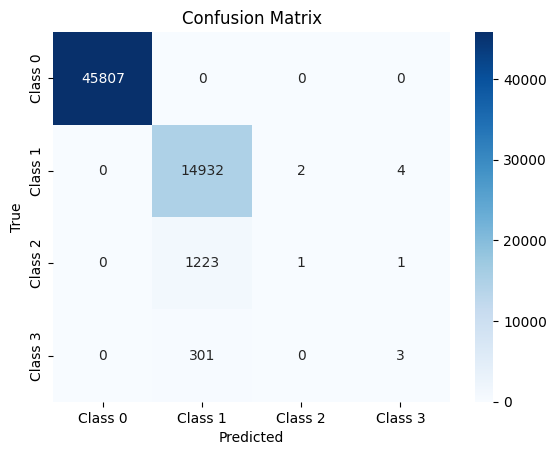

[[45807     0     0     0]
 [    0 14932     2     4]
 [    0  1223     1     1]
 [    0   301     0     3]]
Specificidade média: 0.9919
Sensibilidade média: 0.5026
G-Mean (macro):      0.0533


In [ ]:
import numpy as np, pandas as pd, math, matplotlib.pyplot as plt, seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

# ──────────────────────────  dados  ───────────────────────────
X_final = X.copy()
y       = data['Severity'].values.copy()

# ──────────────────────────  ❶ split 80-20  ───────────────────
X_tr_df, X_te_df, y_tr, y_te = train_test_split(
    X_final, y, train_size=0.8, random_state=42, stratify=y)

print('Train counts:', np.bincount(y_tr))

# ──────────────────────────  ❷ boost nos ‘CL_*’  ──────────────
BOOST   = 3.0
cl_cols = [c for c in X_final.columns if c.startswith('CL_')]
print(f'Boost x{BOOST} aplicado a {len(cl_cols)} colunas CL_*')

X_tr_df[cl_cols] *= BOOST
X_te_df[cl_cols] *= BOOST

# ──────────────────────────  ❸ scaler  ────────────────────────
scaler  = StandardScaler()
X_train = scaler.fit_transform(X_tr_df)
X_test  = scaler.transform(X_te_df)
n_feats = X_train.shape[1]

# ──────────────────────────  ❹ Deep Neural Network  ───────────
from tensorflow.keras import layers, models

inp = tf.keras.Input(shape=(n_feats,))
x = layers.Dense(256)(inp)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(128)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(64)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(32)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

out = layers.Dense(4, activation='softmax')(x)

model = models.Model(inputs=inp, outputs=out)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

early = tf.keras.callbacks.EarlyStopping('val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train, y_tr,
    validation_split=0.2,
    epochs=50, batch_size=32,
    callbacks=[early, tf.keras.callbacks.ReduceLROnPlateau()],
    verbose=1)

# ──────────────────────────  ❺ avaliação  ─────────────────────
y_pred = model.predict(X_test, batch_size=1024).argmax(1)

print(classification_report(y_te, y_pred, digits=4))

cm = confusion_matrix(y_te, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp
    fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10))
    specs.append(tn/(tn+fp+1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### DNN (Weighted)

Train counts: [183228  59750   4899   1215]
Boost x3.0 aplicado a 6 colunas CL_*
Class-weights: {0: 0.33986617765843646, 1: 1.042225941422594, 2: 12.711369667279037, 3: 51.25349794238683}
Epoch 1/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 49s 7ms/step - accuracy: 0.7541 - loss: 0.9908 - val_accuracy: 0.8950 - val_loss: 0.2664 - learning_rate: 0.0010
Epoch 2/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 44s 7ms/step - accuracy: 0.8795 - loss: 0.7641 - val_accuracy: 0.8749 - val_loss: 0.2818 - learning_rate: 0.0010
Epoch 3/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 45s 7ms/step - accuracy: 0.8815 - loss: 0.7663 - val_accuracy: 0.9107 - val_loss: 0.2198 - learning_rate: 0.0010
Epoch 4/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 44s 7ms/step - accuracy: 0.8812 - loss: 0.7459 - val_accuracy: 0.8763 - val_loss: 0.2774 - learning_rate: 0.0010
Epoch 5/50
6228/6228 ━━━━━━━━━━━━━━━━━━━━ 46s 7ms/step - accuracy: 0.8776 - loss: 0.7451 - val_accuracy: 0.8776 - val_loss: 0.2706 - learning_rate: 0.0010
Epoch 6/50
6228/6228 ━━━━━━━━━━━━━━━━

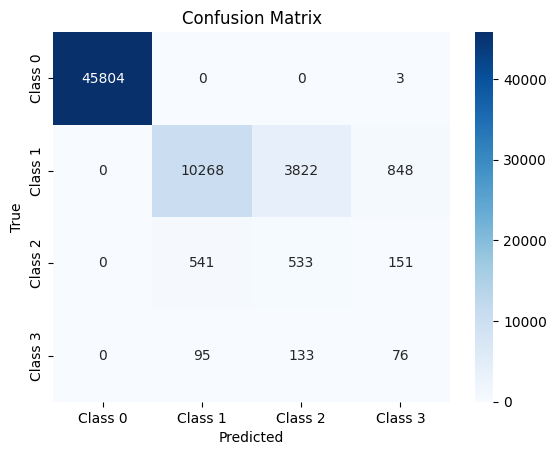

[[45804     0     0     3]
 [    0 10268  3822   848]
 [    0   541   533   151]
 [    0    95   133    76]]
Specificidade média: 0.9764
Sensibilidade média: 0.5931
G-Mean (macro):      0.5229


In [ ]:
import numpy as np, pandas as pd, math, matplotlib.pyplot as plt, seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix

# ──────────────────────────  dados  ───────────────────────────
X_final = X.copy()
y       = data['Severity'].values.copy()

# ──────────────────────────  ❶ split 80-20  ───────────────────
X_tr_df, X_te_df, y_tr, y_te = train_test_split(
    X_final, y, train_size=0.8, random_state=42, stratify=y)

print('Train counts:', np.bincount(y_tr))

# ──────────────────────────  ❷ boost nos ‘CL_*’  ──────────────
BOOST   = 3.0
cl_cols = [c for c in X_final.columns if c.startswith('CL_')]
print(f'Boost x{BOOST} aplicado a {len(cl_cols)} colunas CL_*')

X_tr_df[cl_cols] *= BOOST
X_te_df[cl_cols] *= BOOST

# ──────────────────────────  ❸ scaler  ────────────────────────
scaler  = StandardScaler()
X_train = scaler.fit_transform(X_tr_df)
X_test  = scaler.transform(X_te_df)
n_feats = X_train.shape[1]

# ──────────────────────────  ❹ class weights  ────────────────
cw_vals = class_weight.compute_class_weight(
              class_weight='balanced',
              classes=np.unique(y_tr), y=y_tr)
class_w = {i: float(w) for i, w in enumerate(cw_vals)}
print('Class-weights:', class_w)

# ──────────────────────────  ❺ Deep Neural Network  ───────────
from tensorflow.keras import layers, models

inp = tf.keras.Input(shape=(n_feats,))
x = layers.Dense(256)(inp)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(128)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(64)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(32)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

out = layers.Dense(4, activation='softmax')(x)

model = models.Model(inputs=inp, outputs=out)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

early = tf.keras.callbacks.EarlyStopping('val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train, y_tr,
    validation_split=0.2,
    epochs=50, batch_size=32,
    class_weight=class_w,
    callbacks=[early, tf.keras.callbacks.ReduceLROnPlateau()],
    verbose=1)

# ──────────────────────────  ❻ avaliação  ─────────────────────
y_pred = model.predict(X_test, batch_size=1024).argmax(1)

print(classification_report(y_te, y_pred, digits=4))

cm = confusion_matrix(y_te, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)


specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp
    fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10))
    specs.append(tn/(tn+fp+1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")

### Undersampling DNN

Train counts before undersampling: [183228  59750   4899   1215]
Train counts after undersampling: [1215 1215 1215 1215]
Boost x3.0 aplicado a 6 colunas CL_*
Epoch 1/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.3665 - loss: 1.4491 - val_accuracy: 0.5556 - val_loss: 0.8934 - learning_rate: 0.0010
Epoch 2/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.5913 - loss: 0.8610 - val_accuracy: 0.5689 - val_loss: 0.8402 - learning_rate: 0.0010
Epoch 3/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6075 - loss: 0.7989 - val_accuracy: 0.5864 - val_loss: 0.8260 - learning_rate: 0.0010
Epoch 4/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6372 - loss: 0.7483 - val_accuracy: 0.5792 - val_loss: 0.8354 - learning_rate: 0.0010
Epoch 5/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6488 - loss: 0.7185 - val_accuracy: 0.5823 - val_loss: 0.8448 - learning_rate: 0.0010
Epoch 6/50
122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6572 - loss: 

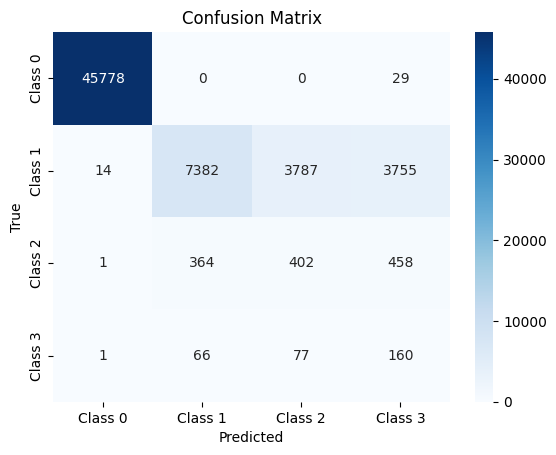

[[45778     0     0    29]
 [   14  7382  3787  3755]
 [    1   364   402   458]
 [    1    66    77   160]]
Specificidade média: 0.9645
Sensibilidade média: 0.5870
G-Mean (macro):      0.5404


In [ ]:
import numpy as np, pandas as pd, math, matplotlib.pyplot as plt, seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils import resample

# ──────────────────────────  dados  ───────────────────────────
X_final = X.copy()
y       = data['Severity'].values.copy()

# ──────────────────────────  ❶ split 80-20  ───────────────────
X_tr_df, X_te_df, y_tr, y_te = train_test_split(
    X_final, y, train_size=0.8, random_state=42, stratify=y)

print('Train counts before undersampling:', np.bincount(y_tr))

# ──────────────────────────  ❷ undersampling ──────────────────
df_train = X_tr_df.copy()
df_train['Severity'] = y_tr

# Separar por classe
df_minority = [df_train[df_train['Severity'] == c] for c in np.unique(y_tr)]
min_size = min([len(df) for df in df_minority])  # tamanho da classe minoritária

# Reduzir todas as classes para o tamanho da menor
df_balanced = pd.concat([
    resample(df, replace=False, n_samples=min_size, random_state=42)
    for df in df_minority
])

# Reembaralhar
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)
y_tr_bal = df_balanced['Severity'].values
X_tr_df = df_balanced.drop(columns='Severity')

print('Train counts after undersampling:', np.bincount(y_tr_bal))

# ──────────────────────────  ❸ boost nos ‘CL_*’  ──────────────
BOOST   = 3.0
cl_cols = [c for c in X_final.columns if c.startswith('CL_')]
print(f'Boost x{BOOST} aplicado a {len(cl_cols)} colunas CL_*')

X_tr_df[cl_cols] *= BOOST
X_te_df[cl_cols] *= BOOST

# ──────────────────────────  ❹ scaler  ────────────────────────
scaler  = StandardScaler()
X_train = scaler.fit_transform(X_tr_df)
X_test  = scaler.transform(X_te_df)
n_feats = X_train.shape[1]

# ──────────────────────────  ❺ Deep Neural Network  ───────────
from tensorflow.keras import layers, models

inp = tf.keras.Input(shape=(n_feats,))
x = layers.Dense(256)(inp)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(128)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(64)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(32)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

out = layers.Dense(4, activation='softmax')(x)

model = models.Model(inputs=inp, outputs=out)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

early = tf.keras.callbacks.EarlyStopping('val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train, y_tr_bal,
    validation_split=0.2,
    epochs=50, batch_size=32,
    callbacks=[early, tf.keras.callbacks.ReduceLROnPlateau()],
    verbose=1)

# ──────────────────────────  ❻ avaliação  ─────────────────────
y_pred = model.predict(X_test, batch_size=1024).argmax(1)

print(classification_report(y_te, y_pred, digits=4))

cm = confusion_matrix(y_te, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)


specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp
    fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10))
    specs.append(tn/(tn+fp+1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


### Oversampling DNN

Train counts before SMOTE: [183228  59750   4899   1215]
Train counts after SMOTE: [183228 183228 183228 183228]
Boost x3.0 aplicado a 6 colunas CL_*
Epoch 1/50
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 137s 7ms/step - accuracy: 0.7235 - loss: 0.5866 - val_accuracy: 0.3456 - val_loss: 1.4060 - learning_rate: 0.0010
Epoch 2/50
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 131s 7ms/step - accuracy: 0.7901 - loss: 0.4652 - val_accuracy: 0.5707 - val_loss: 1.0049 - learning_rate: 0.0010
Epoch 3/50
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 135s 7ms/step - accuracy: 0.8117 - loss: 0.4232 - val_accuracy: 0.6754 - val_loss: 0.7906 - learning_rate: 0.0010
Epoch 4/50
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 129s 7ms/step - accuracy: 0.8220 - loss: 0.4022 - val_accuracy: 0.7560 - val_loss: 0.6575 - learning_rate: 0.0010
Epoch 5/50
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 142s 8ms/step - accuracy: 0.8291 - loss: 0.3888 - val_accuracy: 0.7785 - val_loss: 0.6071 - learning_rate: 0.0010
Epoch 6/50
18323/18323 ━━━━━━━━━━━━━━━━━━━━ 135s 7ms/step - 

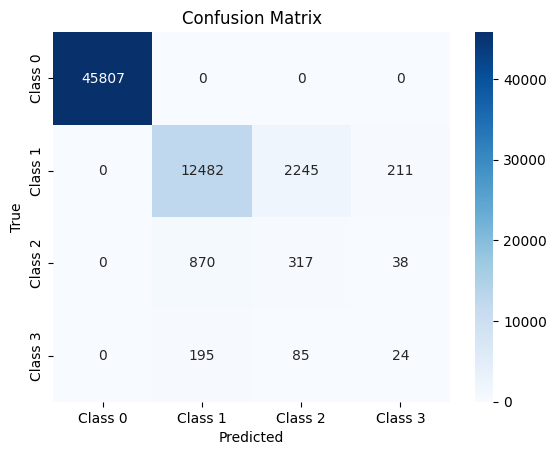

[[45807     0     0     0]
 [    0 12482  2245   211]
 [    0   870   317    38]
 [    0   195    85    24]]
Specificidade média: 0.9838
Sensibilidade média: 0.5433
G-Mean (macro):      0.3615


In [ ]:
import numpy as np, pandas as pd, math, matplotlib.pyplot as plt, seaborn as sns
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE  # ← Importante

# ──────────────────────────  dados  ───────────────────────────
X_final = X.copy()
y       = data['Severity'].values.copy()

# ──────────────────────────  ❶ split 80-20  ───────────────────
X_tr_df, X_te_df, y_tr, y_te = train_test_split(
    X_final, y, train_size=0.8, random_state=42, stratify=y)

print('Train counts before SMOTE:', np.bincount(y_tr))

# ──────────────────────────  ❷ SMOTE ───────────────────────────
smote = SMOTE(random_state=42)
X_tr_res, y_tr_res = smote.fit_resample(X_tr_df, y_tr)

print('Train counts after SMOTE:', np.bincount(y_tr_res))

# ──────────────────────────  ❸ boost nos ‘CL_*’  ──────────────
BOOST   = 3.0
cl_cols = [c for c in X_final.columns if c.startswith('CL_')]
print(f'Boost x{BOOST} aplicado a {len(cl_cols)} colunas CL_*')

X_tr_res[cl_cols] *= BOOST
X_te_df[cl_cols]  *= BOOST

# ──────────────────────────  ❹ scaler  ────────────────────────
scaler  = StandardScaler()
X_train = scaler.fit_transform(X_tr_res)
X_test  = scaler.transform(X_te_df)
n_feats = X_train.shape[1]

# ──────────────────────────  ❺ Deep Neural Network  ───────────
from tensorflow.keras import layers, models

inp = tf.keras.Input(shape=(n_feats,))
x = layers.Dense(256)(inp)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(128)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(64)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)

x = layers.Dense(32)(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

out = layers.Dense(4, activation='softmax')(x)

model = models.Model(inputs=inp, outputs=out)
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

early = tf.keras.callbacks.EarlyStopping('val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    X_train, y_tr_res,
    validation_split=0.2,
    epochs=50, batch_size=32,
    callbacks=[early, tf.keras.callbacks.ReduceLROnPlateau()],
    verbose=1)

# ──────────────────────────  ❻ avaliação  ─────────────────────
y_pred = model.predict(X_test, batch_size=1024).argmax(1)

print(classification_report(y_te, y_pred, digits=4))

cm = confusion_matrix(y_te, y_pred, labels=[0,1,2,3])
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Class 0','Class 1','Class 2','Class 3'], yticklabels=['Class 0','Class 1','Class 2','Class 3'])
plt.title('Confusion Matrix'); plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()
print(cm)

specs, sens = [], []
for i in range(4):
    tp = cm[i,i]; fn = cm[i,:].sum()-tp
    fp = cm[:,i].sum()-tp; tn = cm.sum()-(tp+fn+fp)
    sens.append(tp/(tp+fn+1e-10))
    specs.append(tn/(tn+fp+1e-10))

print(f"Specificidade média: {np.mean(specs):.4f}")
print(f"Sensibilidade média: {np.mean(sens):.4f}")
print(f"G-Mean (macro):      {(math.prod(sens)**0.25):.4f}")


# Agrupamento Espacial
Group accident coordinates spatially to identify zones with a higher probability of severe accidents and evaluate if this improves model performance.

In [ ]:
pip install pandas openpyxl folium

## Analyze severity within groups

### Subtask:
Calculate the average severity or the distribution of severity levels within each spatial group.


In [ ]:
# 1) Usar detecção automática das colunas Latitude/Longitude (ou lat/lon, x/y…)
python heatmap_portugal.py "Data_Sinistralidade_v2.xlsx"

# 2) Se as tuas colunas tiverem nomes específicos
python heatmap_portugal.py "Data_Sinistralidade_v2.xlsx" --lat-col Latitude --lon-col Longitude

# 3) Ajustar o “rasto” de cada ponto (radius/blur) e exportar também CSV de pontos válidos
python heatmap_portugal.py "Data_Sinistralidade_v2.xlsx" --radius 12 --blur 18 --export-clean


SyntaxError: invalid syntax (ipython-input-3037137549.py, line 2)

In [ ]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# === 1) Carregar dados ===
FILE = r"/content/drive/MyDrive/Tese/Data_Sinistralidade_v2.xlsx"
df = pd.read_excel(FILE)

# Converter vírgula decimal para float
def to_float_pt(series):
    return pd.to_numeric(series.astype(str).str.replace(",", ".", regex=False).str.strip(),
                         errors="coerce")

lat_col = "Coordenadas Latitude"
lon_col = "Coordenadas Longitude"
df[lat_col] = to_float_pt(df[lat_col])
df[lon_col] = to_float_pt(df[lon_col])
df = df.dropna(subset=[lat_col, lon_col])

# === 2) Filtrar para Portugal continental ===
PT_MAINLAND = dict(lat_min=36.5, lat_max=42.3, lon_min=-9.8, lon_max=-6.0)
df = df[
    (df[lat_col] >= PT_MAINLAND["lat_min"]) & (df[lat_col] <= PT_MAINLAND["lat_max"]) &
    (df[lon_col] >= PT_MAINLAND["lon_min"]) & (df[lon_col] <= PT_MAINLAND["lon_max"])
]

print(f"Pontos válidos: {len(df)}")

# === 3) Criar heatmap ===
import branca.colormap as bcm

# --- Gradiente usado no HeatMap e na legenda (cores quentes) ---
gradient = {
    0.00: '#ffffb2',  # amarelo claro (baixo)
    0.40: '#fecc5c',  # laranja
    0.70: '#fd8d3c',  # vermelho
    1.00: '#800026',  # castanho (alto)
}

# Criar o mapa
center = [df[lat_col].mean(), df[lon_col].mean()]
m = folium.Map(location=center, zoom_start=6, tiles="cartodbpositron")

# Camada de heatmap com o mesmo gradiente
HeatMap(
    df[[lat_col, lon_col]].values.tolist(),
    radius=12,
    blur=18,
    min_opacity=0.3,
    max_zoom=12,
    gradient=gradient
).add_to(m)

# Barra de cores (legenda) — densidade relativa 0..1
colormap = bcm.LinearColormap(
    colors=[gradient[k] for k in sorted(gradient.keys())],
    index=sorted(gradient.keys()),
    vmin=0, vmax=1,
    caption='Densidade relativa de acidentes (0 = baixo · 1 = alto)'
)
colormap.add_to(m)

# Guardar/mostrar
out_path = "/content/drive/MyDrive/Tese/heatmap_portugal.html"
m.save(out_path)
print("Mapa criado em:", out_path)
m


Pontos válidos: 333212
Mapa criado em: /content/drive/MyDrive/Tese/heatmap_portugal.html


In [ ]:
!pip install -q pandas openpyxl folium branca h3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.3 MB/s eta 0:00:00


In [ ]:
import pandas as pd

FILE = r"/content/drive/MyDrive/Tese/Data_Sinistralidade_v2.xlsx"
LAT = "Coordenadas Latitude"
LON = "Coordenadas Longitude"

def to_float_pt(s):
    return pd.to_numeric(s.astype(str).str.replace(",", ".", regex=False).str.strip(), errors="coerce")

df = pd.read_excel(FILE)
df[LAT] = to_float_pt(df[LAT])
df[LON] = to_float_pt(df[LON])
df = df.dropna(subset=[LAT, LON])

# Portugal continental (caixa aproximada)
PT = dict(lat_min=36.5, lat_max=42.3, lon_min=-9.8, lon_max=-6.0)
df = df[(df[LAT].between(PT["lat_min"], PT["lat_max"])) & (df[LON].between(PT["lon_min"], PT["lon_max"]))]

print("Pontos válidos:", len(df))
df.head(2)

Pontos válidos: 333212


,PAV,NPAV,Data,Hora da Ocorrência,Acidente denunciado,Feriado,Mortos,F. Graves,F. Leves,Natureza do acidente,...,Freguesia,Localização,Tipo de via,Designação da via,Km / N.º Polícia,Sentido (c/ separador central),Coordenadas Latitude,Coordenadas Longitude,Causa Provável,Fuga
0,G0004813/19.220130451,00704/2019 220130451,2019-12-30,19:00:00,Não,Não,0,0,0,Colisão,...,União das freguesias de Margaride (Santa Eulál...,Dentro de localidade,Arruamento,Rua Dom Manuel Faria e Sousa,NaN,NaN,41.36206,-8.200085,Distração,Não
1,G0004337/19.220130453,00462/2019 220130453,2019-12-28,11:45:00,Não,Não,0,0,0,Colisão,...,"União das freguesias de Cristelos, Boim e Ordem",Dentro de localidade,Arruamento,Rua de Santo André,NaN,NaN,41.26933,-8.287138,Distração,Não


In [ ]:
import math
import h3

# --- Parâmetro principal: resolução H3 ---
# res=6 ≈ 5.24 km² por hex; res=7 ≈ 0.75 km²; res=5 ≈ 38 km²
H3_RES = 6

# Funções compatíveis com v3/v4 do h3
def to_cell(lat, lon, res):
    # v4
    if hasattr(h3, "latlng_to_cell"):
        return h3.latlng_to_cell(lat, lon, res)
    # v3
    return h3.geo_to_h3(lat, lon, res)

def cell_boundary(cell):
    """
    Devolve lista uniforme de vértices (lat, lon) para o hex.
    Compatível com h3 v3 e v4.
    """
    if hasattr(h3, "cell_to_boundary"):          # v4 -> [(lat, lon), ...]
        boundary = h3.cell_to_boundary(cell)
    else:                                        # v3
        boundary = h3.h3_to_geo_boundary(cell, geo_json=False)
    return [(lat, lon) for (lat, lon) in boundary]
# Área do hex (km²) – tenta API; senão usa média conhecida
def hex_area_km2(res):
    # v4: average_hexagon_area(res) existe?
    if hasattr(h3, "average_hexagon_area"):
        return h3.average_hexagon_area(res, "km^2")
    # fallback por tabela (aprox.)
    avg = {5: 38.0, 6: 5.24, 7: 0.75, 8: 0.11}
    return avg.get(res, 5.24)

area_km2 = hex_area_km2(H3_RES)

# Atribuir cada ponto ao seu hex
df["h3"] = [to_cell(lat, lon, H3_RES) for lat, lon in zip(df[LAT], df[LON])]

# Contagem por hex
counts = df.groupby("h3").size().rename("accidents").reset_index()

# Densidade: acidentes por km² (aprox. pela área média do res)
counts["acc_per_km2"] = counts["accidents"] / area_km2

counts.head()


,h3,accidents,acc_per_km2
0,863900187ffffff,1,0.027679
1,863900487ffffff,8,0.221428
2,863900497ffffff,38,1.051785
3,86390049fffffff,10,0.276785
4,863900597ffffff,8,0.221428


from matplotlib import pyplot as plt
_df_0['accidents'].plot(kind='hist', bins=20, title='accidents')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['acc_per_km2'].plot(kind='hist', bins=20, title='acc_per_km2')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_2.groupby('h3').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3.plot(kind='scatter', x='accidents', y='acc_per_km2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4['accidents'].plot(kind='line', figsize=(8, 4), title='accidents')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_5['acc_per_km2'].plot(kind='line', figsize=(8, 4), title='acc_per_km2')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_6['h3'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_6, x='accidents', y='h3', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_7['h3'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_7, x='acc_per_km2', y='h3', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
import folium
from branca.colormap import StepColormap
from branca.element import Template, MacroElement

# ---------- GeoJSON dos hexágonos ----------
features = []
for _, row in counts.iterrows():
    cell = row["h3"]
    poly = cell_boundary(cell)  # [(lat, lon), ...]
    # Folium/GeoJSON usam [lon, lat]
    coords = [[lon, lat] for (lat, lon) in poly]
    if coords[0] != coords[-1]:
        coords.append(coords[0])  # fechar polígono

    features.append({
        "type": "Feature",
        "properties": {
            "h3": cell,
            "accidents": int(row["accidents"]),
            "acc_per_km2": float(row["acc_per_km2"])
        },
        "geometry": {"type": "Polygon", "coordinates": [coords]}
    })

geojson = {"type": "FeatureCollection", "features": features}

# ---------- Colormap DISCRETA por acidentes/km² ----------
bins = [0, 5, 15, 25, 35, 45]   # último bin é >45
colors = [
    "#fff9c4",  # 0–5   amarelo claro
    "#ffd54f",  # 5–15  amarelo académico (amber)
    "#ff9800",  # 15–25 laranja
    "#ff7043",  # 25–35 vermelho alaranjado
    "#f44336",  # 35–45 vermelho
    "#7f0000",  # >45   vermelho escuro/acastanhado
]
colormap = StepColormap(colors=colors, index=bins, vmin=bins[0], vmax=bins[-1],
                        caption=f"Acidentes por km² (hex H3 res={H3_RES})")

# ---------- Mapa ----------
center = [df[LAT].mean(), df[LON].mean()]
m = folium.Map(location=center, zoom_start=6, tiles="cartodbpositron")

def style_fn(feature):
    value = feature["properties"]["acc_per_km2"]   # pintar por acidentes/km²
    return {
        "fillColor": colormap(value),
        "color": "#555555",
        "weight": 0.5,
        "fillOpacity": 0.7,
    }

tooltip = folium.GeoJsonTooltip(
    fields=["accidents", "acc_per_km2"],
    aliases=["Acidentes:", "Acidentes por km²:"],
    localize=True,
    sticky=False
)

folium.GeoJson(geojson, style_function=style_fn, tooltip=tooltip,
               name="Acidentes por km²").add_to(m)

# (Opcional) barra padrão em baixo — comenta a linha abaixo se só quiseres a legenda lateral
# colormap.add_to(m)

# ---------- Legenda LATERAL para “print” ----------
labels = [f"{bins[i]}–{bins[i+1]}" for i in range(len(bins)-1)] + [f">{bins[-1]}"]
rows_html = "".join([
    f"""
    <div style="display:flex; align-items:center; margin:4px 0;">
      <span style="display:inline-block; width:18px; height:12px;
                   background:{colors[i]}; border:1px solid #777; margin-right:8px;"></span>
      <span>{labels[i]}</span>
    </div>
    """ for i in range(len(colors))
])

legend_html = f"""
{{% macro html(this, kwargs) %}}
<div style="
  position: fixed;
  top: 80px; right: 12px;
  z-index: 9999;
  background: white;
  padding: 12px 14px;
  border: 1px solid #bbb;
  border-radius: 10px;
  box-shadow: 0 2px 14px rgba(0,0,0,0.18);
  font-family: Arial, sans-serif;
  ">
  <div style="font-weight: 600; font-size: 14px; margin-bottom: 6px;">
    Acidentes por km²
  </div>
  <div style="font-size: 12px; color:#555; margin-bottom: 8px;">
    hex H3 res={H3_RES}
  </div>
  <div style="line-height: 1.2; font-size: 13px;">
    {rows_html}
  </div>
</div>
{{% endmacro %}}
"""
legend = MacroElement()
legend._template = Template(legend_html)
m.get_root().add_child(legend)

folium.LayerControl(collapsed=False).add_to(m)

OUT_HTML = "/content/drive/MyDrive/Tese/choropleth_acidentes_km2.html"
m.save(OUT_HTML)
print("Mapa criado em:", OUT_HTML)

m


Mapa criado em: /content/drive/MyDrive/Tese/choropleth_acidentes_km2.html


In [ ]:
# ============================================================
# Choropleth de acidentes por km² em Portugal (hexágonos H3)
# - Lê Excel com vírgula decimal (PT)
# - Agrega em H3 (res ajustável)
# - Pinta por "acidentes por km²" em classes discretas
# - Adiciona LEGENDA LATERAL fixa para "print"
# ============================================================

import pandas as pd
import folium
from branca.colormap import StepColormap
from branca.element import Element
import h3

# ---------- 1) CONFIGURAÇÕES ----------
FILE = r"/content/drive/MyDrive/Tese/Data_Sinistralidade_v2.xlsx"
LAT = "Coordenadas Latitude"
LON = "Coordenadas Longitude"

# Limites PT continental (WGS84)
PT = dict(lat_min=36.5, lat_max=42.3, lon_min=-9.8, lon_max=-6.0)

# Resolução H3:
# res=5 ≈ 38 km² | res=6 ≈ 5.24 km² | res=7 ≈ 0.75 km²
H3_RES = 6

# Classes (acidentes por km²) e cores quentes
BINS = [0, 5, 15, 25, 35, 45]  # último bin é >45
COLORS = [
    "#fff9c4",  # 0–5   amarelo claro
    "#ffd54f",  # 5–15  amarelo académico (amber)
    "#ff9800",  # 15–25 laranja
    "#ff7043",  # 25–35 vermelho alaranjado
    "#f44336",  # 35–45 vermelho
    "#7f0000",  # >45   vermelho escuro/acastanhado
]

# ---------- 2) FUNÇÕES AUXILIARES ----------
def to_float_pt(series):
    """Converte '41,36206' -> 41.36206; mantém floats; devolve NaN se não conversível."""
    if pd.api.types.is_numeric_dtype(series):
        return pd.to_numeric(series, errors="coerce")
    return pd.to_numeric(series.astype(str).str.replace(",", ".", regex=False).str.strip(),
                         errors="coerce")

def to_cell(lat, lon, res):
    """H3 v4/v3: devolve ID da célula H3 para (lat, lon)."""
    return h3.latlng_to_cell(lat, lon, res) if hasattr(h3, "latlng_to_cell") else h3.geo_to_h3(lat, lon, res)

def cell_boundary(cell):
    """Devolve lista de vértices (lat, lon) do hex (compatível v3/v4)."""
    if hasattr(h3, "cell_to_boundary"):
        boundary = h3.cell_to_boundary(cell)     # v4
    else:
        boundary = h3.h3_to_geo_boundary(cell, geo_json=False)  # v3
    return [(lat, lon) for (lat, lon) in boundary]

def hex_area_km2(res):
    """Área média por hex na resolução dada, em km²."""
    if hasattr(h3, "average_hexagon_area"):
        return h3.average_hexagon_area(res, "km^2")
    lookup = {5: 38.0, 6: 5.24, 7: 0.75, 8: 0.11}
    return lookup.get(res, 5.24)

# ---------- 3) LER E PREPARAR DADOS ----------
df = pd.read_excel(FILE)
if LAT not in df.columns or LON not in df.columns:
    raise ValueError(f"Colunas '{LAT}' e/ou '{LON}' não encontradas. Colunas: {list(df.columns)}")

df[LAT] = to_float_pt(df[LAT])
df[LON] = to_float_pt(df[LON])
df = df.dropna(subset=[LAT, LON])

# Filtrar Portugal continental
df = df[
    (df[LAT].between(PT["lat_min"], PT["lat_max"])) &
    (df[LON].between(PT["lon_min"], PT["lon_max"]))
]
print("Pontos válidos:", len(df))

# ---------- 4) AGREGAR EM H3 E CALCULAR DENSIDADE ----------
area_km2 = hex_area_km2(H3_RES)
df["h3"] = [to_cell(lat, lon, H3_RES) for lat, lon in zip(df[LAT], df[LON])]
counts = df.groupby("h3").size().rename("accidents").reset_index()
counts["acc_per_km2"] = counts["accidents"] / area_km2

if counts.empty:
    raise RuntimeError("Sem células H3 após agregação. Verifica dados/limites H3_RES/caixa PT.")

# ---------- 5) CRIAR GEOJSON ----------
features = []
for _, row in counts.iterrows():
    cell = row["h3"]
    poly = cell_boundary(cell)                         # [(lat, lon), ...]
    coords = [[lon, lat] for (lat, lon) in poly]       # GeoJSON usa [lon, lat]
    if coords[0] != coords[-1]:
        coords.append(coords[0])                       # fechar o polígono
    features.append({
        "type": "Feature",
        "properties": {
            "h3": cell,
            "accidents": int(row["accidents"]),
            "acc_per_km2": float(row["acc_per_km2"])
        },
        "geometry": {"type": "Polygon", "coordinates": [coords]}
    })
geojson = {"type": "FeatureCollection", "features": features}

# ---------- 6) MAPA + ESTILO ----------
center = [df[LAT].mean(), df[LON].mean()]
m = folium.Map(location=center, zoom_start=6, tiles="cartodbpositron")

colormap = StepColormap(
    colors=COLORS,
    index=BINS,
    vmin=BINS[0],
    vmax=BINS[-1],
    caption=f"Acidentes por km² (hex H3 res={H3_RES})"
)

def style_fn(feature):
    v = feature["properties"]["acc_per_km2"]
    return {
        "fillColor": colormap(v),
        "color": "#555555",
        "weight": 0.5,
        "fillOpacity": 0.7,
    }

tooltip = folium.GeoJsonTooltip(
    fields=["accidents", "acc_per_km2"],
    aliases=["Acidentes:", "Acidentes por km²:"],
    localize=True,
    sticky=False
)

folium.GeoJson(
    geojson,
    style_function=style_fn,
    tooltip=tooltip,
    name="Acidentes por km²"
).add_to(m)

# (Opcional) barra padrão do StepColormap (se quiseres as DUAS legendas, mantém; senão comenta)
# colormap.add_to(m)

# ---------- 7) LEGENDA LATERAL FIXA (para print) ----------
labels = [f"{BINS[i]}–{BINS[i+1]}" for i in range(len(BINS)-1)] + [f">{BINS[-1]}"]
rows_html = "".join(
    f"""
    <div style="display:flex; align-items:center; margin:4px 0;">
      <span style="display:inline-block; width:18px; height:12px;
                   background:{COLORS[i]}; border:1px solid #777; margin-right:8px;"></span>
      <span style="font-size:13px;">{labels[i]}</span>
    </div>
    """
    for i in range(len(COLORS))
)

legend_html = f"""
<div style="
  position: fixed;
  top: 80px; left: 12px;
  z-index: 9999;
  background: white;
  padding: 12px 14px;
  border: 1px solid #bbb;
  border-radius: 10px;
  box-shadow: 0 2px 14px rgba(0,0,0,0.18);
  font-family: Arial, sans-serif;
  ">
  <div style="font-weight: 600; font-size: 14px; margin-bottom: 6px;">
    Acidentes por km²
  </div>
  <div style="font-size: 12px; color:#555; margin-bottom: 8px;">
    hex H3 res={H3_RES}
  </div>
  {rows_html}
</div>
"""
m.get_root().html.add_child(Element(legend_html))

folium.LayerControl(collapsed=False).add_to(m)

# ---------- 8) GUARDAR E MOSTRAR ----------
OUT_HTML = "/content/drive/MyDrive/Tese/choropleth_acidentes_km2.html"
m.save(OUT_HTML)
print("Mapa criado em:", OUT_HTML)

m


Pontos válidos: 333212
Mapa criado em: /content/drive/MyDrive/Tese/choropleth_acidentes_km2.html
